# Goals of this Notebook

To learn:
- Useful Python functions and techniques
- How to measure code speed and memory usage
  - ... in order to increase speed and reduce memory usage
- Python skills for large data sets
- Skills for the readability of programming code

Specific techniques
- Review  <font face='courier'>for</font> loops
- Comprehensions
  - List comprehension
  - Dictionary comprehension
  - Set comprehension
- Inputting data from text files
- Generators, iterators, and iterables
  - Including <code>itertools</code> package and <code>iter()</code>
- Computations with large data sets
- <code>zip()</code>, <code>map()</code>, <code>filter()</code>
- Code profiling
  - Speed: <code>line_profiler</code>, <code>timeit</code>, <code>time</code> package
  - Memory: <code>memory_profiler</code>, <code>memit</code>, <code>\_\_sizeof\_\_</code> package
- Handling large files with generators
  - Input, computation      

Introducing MSBA Topics
- Time series analysis
- Descriptive statistics
- Handling large data sets

# Code Development

Three stages of code development can be described as:
- Get it working
  - The code runs without errors
- Get it working correctly
  - the code outputs a correct result for given input
- Increase code speed and reduce memory usage

Throughout code development, one must endeavor to:
- Make code more readable

Criteria of readability include:
- Succinctness
  - Reduce the number of lines of code
- Simplicity
  - Reduce the length and complexity of code statements
  
We will pay attention to these criteria as we proceed.

Business analytics professionals must know how to 
- Access data programmatically
- Use <code>for</code> loops

While the <font face='courier'>numpy</font> and <font face='courier'>pandas</font> packages have utilities for inputting data into <code>arrays</code> and <code>DataFrames</code>, respectively, programmers need to do this in some instances with base Python statements, and so we will demonstrate how to do that.  In addition, data input provides a good opportunity for gaining experience with <code>for</code> loops and so we will gain experience by applying the latter to the former.   

In addition, while the <font face='courier'>numpy</font> and <font face='courier'>pandas</font> packages ease data acquisition, they hide important details from you which are very important to know.  So, if you understand how to input data with base Python, then you will be in a better position to troubleshoot problems you might have with inputting data with <font face='courier'>numpy</font> and <font face='courier'>pandas</font>.    

xxx revise/remove xxx
# Navigation <a name='navigation' />
- <a href = #loops><font face='courier'>for</font> loop refresher</a> 
- <a href = #ListComprehension>List Comprehension</a>
- <a href = #dictionaries>Dictionary refresher</a>
  - <a href = #LoopThroughDict>Looping through dictionaries</a>
- <a href = #DictComp>Dictionary Comprehension</a>
- <a href = #aliasing>Aliasing</a>


# The <code>zip()</code>, <code>map()</code>, and <code>filter()</code>  Functions ... and the <code>*</code> Operator

These functions are very useful, although accessing the results can be a bit unintuitive for somebody new to Python.  We will demonstrate how to view results from these functions now, and much more later about the details of how these work.

## <code>zip()</code> Function

The <code>zip()</code> function takes as input two or more lists, tuples, or other iterable data type and outputs a number of tuples equal to the length of the inputs.

Each of the output tuples, respectively, is the combination of the 0th element from each of the inputs, the 1st elements from the inputs and so forth.

Statement|Result|
:---: | :---: |
<code>zip((0,1),(2,3),(4,5))</code>|<code>((0, 2, 4),(1, 3, 5))</code>|

If the input tuples represented rows of a matrix, then <code>zip()</code> produces the rows of the transpose matrix.

Notice that printing the output does not reveal the data, but merely indicates that the result is of the <code>zip</code> data type.  This data type is an examples of an <code>iterator</code>, which we will discuss in detail later.  Its values can be retrieved in a number of ways as demonstrated below.

In [80]:
zip((0,1),(2,3),(4,5))

Retrieval with a <code>for</code> loop, list comprehension, and the asterisk, <code>*</code> operator, respectively.

In [81]:
for x in zip((0,1),(2,3),(4,5)):
    print(x)

(0, 2, 4)
(1, 3, 5)


In [82]:
[x for x in zip((0,1),(2,3),(4,5))]

[(0, 2, 4), (1, 3, 5)]

The <code>*</code> (asterisk) operator affords the same functionalty as does list comprehension in terms of viewing the result: it unpacks the <code>zip</code> result, which is a tuple of tuples in this case, so the sub-tuples can be repacked into a list.

In [83]:
result = zip((0,1),(2,3),(4,5))
[*result]

[(0, 2, 4), (1, 3, 5)]

In [ ]:
result = zip((0,1),(2,3),(4,5))
list(result)

In [87]:
result = zip((0,1),(2,3),(4,5))
tuple(result)

((0, 2, 4), (1, 3, 5))

An example where zip is useful is when data for a <code>matplotlib</code> line plot is supplied in a list of lists, but must be transformed into two variables, one containing the <code>x</code> data and one containing the <code>y</code> data.

The <code>*</code> (asterisk) is used here to 'unpack' the sublists of the input data so that the <code>zip()</code> function and reorganize those inner sublists.

In [88]:
import matplotlib.pyplot as plt

In [87]:
data = [[0,0], [1,1], [2,2], [3,0], [4,1], [5,2], [6,0], [7,1], [8,2], [9,0]]

In [89]:
data_xy = zip(*data)
for series in data_xy:
    print(series)

(0, 1, 2, 3, 4, 5, 6, 7, 8, 9)
(0, 1, 2, 0, 1, 2, 0, 1, 2, 0)


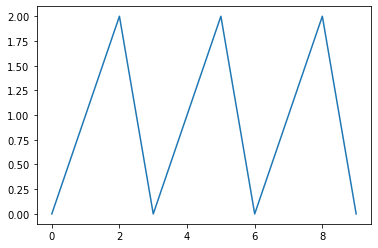

In [109]:
x, y = zip(*data)
plt.plot(x, y)
plt.show()

In a similar way, the <code>zip()</code> function is often used to prepare sets of parameters to be fed into a function in a multiprocessing context, as shown in a simplified below to compute the distance between a list of origins and another list of corresponding destinations.

In [110]:
def dist(p, q):
    import math
    return math.sqrt(sum([abs(p[i] - q[i])**2 for i in range(len(p))]))

In [111]:
origin = [[0,0], [1,5], [4,2], [8,1]]
dest = [[9,5], [1,7], [0,5], [6,2]]

arg = zip(origin, dest)

for a in arg:
    print(f'The distance between {a[0]} and {a[1]} is {dist(*a)}')

The distance between [0, 0] and [9, 5] is 10.295630140987
The distance between [1, 5] and [1, 7] is 2.0
The distance between [4, 2] and [0, 5] is 5.0
The distance between [8, 1] and [6, 2] is 2.23606797749979


## <code>map()</code> Function

The <code>map()</code> function takes a function as its first argument and an iterable data type (e.g., list, tuple) as its second element.  It applies the function to each of the elements of the iterable data.

The result is a <code>map</code> data type that is an iterator, as was the case with the <code>zip</code> function.

The applied functions are often <code>lambda</code> functions although custom function and built-in functions can be applied also.

In [112]:
result = map(lambda x:x**2, range(4))
type(result)

map

In [113]:
result = map(lambda x:x**2, range(4))
result

In [114]:
result = map(lambda x:x**2, range(4))
for r in result:
    print(r)

0
1
4
9


In [115]:
result = map(lambda x:x**2, range(4))
[*result]

[0, 1, 4, 9]

In [288]:
result = map(lambda x:x**2, range(4))
list(result)

[0, 1, 4, 9]

In [116]:
result = map(lambda x:x**2, range(4))
[r for r in result]

[0, 1, 4, 9]

In [120]:
data = ['1', '3', '5', '6', '8']
data = map(int, data)
data = [*data]
print(data)
print(type(data[0]))

[1, 3, 5, 6, 8]
<class 'int'>


Other <code>map()</code> examples with...

- Custom functions
- <code>sum</code>
- <code>len()</code> function
- <code>min()</code> and <code>max()</code> functions

In [91]:
def sq(x):
    return x**2

[*map(sq, range(5))]

[0, 1, 4, 9, 16]

In [90]:
data = [[0,1,2,3], [4,5,6,7], [8,9,10,11]]
result = map(sum, data)
for r in result:
    print(r)

6
22
38


In [292]:
import random

my_list = [[random.random() for _ in range(random.randint(1,6))] for _ in range(5)]

[*map(len, my_list)]

[5, 5, 5, 5, 2]

In [293]:
[*map(min, my_list)]

[0.004610587216948847,
 0.07922660906000856,
 0.2300322285908757,
 0.46871349869564816,
 0.11612568347279228]

In [295]:
[*map(max, my_list)]

[0.8107720972285645,
 0.4706235969932422,
 0.7763621621379957,
 0.9984155631796284,
 0.20793792824718915]

## <code>filter()</code> Function

The filter function takes a function as its first argument and a iterable data type as its second argument.  The function is applied to each element of the iterable argument and its output is interpreted as <code>True</code> or <code>False</code>, and it returns only those elements of the iterable argument where the function result is <code>True</code>.

Similar to <code>zip()</code> and <code>map()</code>, <code>filter()</code> returns an iterator whose values must be unpacked in order to view them.  The iterator can eb used directly in a for loop or list comprehension.

In [121]:
filter(lambda x: x%2 == 0, range(10))

In [122]:
result = filter(lambda x: x%2 == 0, range(10))
[*result]

[0, 2, 4, 6, 8]

In [92]:
result_explain = map(lambda x: x%2 == 0, range(10))
[*result_explain]

[True, False, True, False, True, False, True, False, True, False]

In [123]:
import random

def big(x):
    return x >= 0.5

data = [random.random() for _ in range(20)]
result = filter(big, data)
[*result]

[0.830120419312502,
 0.9474745801638256,
 0.7739877054352448,
 0.6600470314311495,
 0.9693698561634513,
 0.5395149121508982,
 0.7245959041718371,
 0.7881975877202262]

In [124]:
data = [random.random() for _ in range(20)]
result = filter(big, data)

while True:
    print(next(result))

0.6771310133661214
0.6152254956387349
0.566736619260989
0.860003272366115
0.8351282697786196
0.8614013427035372
0.6220801257139444
0.9823913189772012
0.7388358238082972
0.6059935842234422
0.6328798703550202
0.9369722058971219
0.5945543946499621


StopIteration: 

## More about the <font style="font-family:'Courier New">*</font> Operator <a name='asterisk_op' />

Newcomers to Python as well as many others first think of <code>*</code> as denoting a multiplication operation, but there is another meaning, which is to unpack Python data types that are collections of elements.  We introduce the notion of unpacking in this section in the context of well known Python data types, including lists, tuples, and dictionaries.  The <code>*</code> operator becomes even more important when we talk about generators and iterators, which we do next, but it is easiest to introduce it in the context of basic Python types.

Take these lists and tuples, for example,
<code>
    ls_1 = [0, 1, 2]
    ls_2 = [[0, 1], [2, 3], [4, 5]]
    ls_3 = [(0, 1), (2, 3), (4, 5)]
    t_1 = (0, 1, 2)
    t_2 = ([0, 1], [2, 3], [4, 5])
    t_3 = ((0, 1), (2, 3), (4, 5))
</code>

You can think of the <code>*</code> placed in fornt of one of these variable names as removing the outer container type.  That is, in the respective order above, we would have three uncontained integers, three uncontained sub-lists, and three uncontained tuples in that order or, in effect,

<code>
    *ls_1 = 0, 1, 2
    *ls_2 = [0, 1], [2, 3], [4, 5]
    *ls_3 = (0, 1), (2, 3), (4, 5)
    *t_1 = 0, 1, 2
    *t_2 = [0, 1], [2, 3], [4, 5]
    *t_3 = (0, 1), (2, 3), (4, 5)
</code>

The statements above are not valid Python statements but, rather, demonstrate, in effect, what <code>*</code> does. To further demonstrate, we will try to evaluate one of these starred expressions.

In [193]:
ls_1 = [0, 1, 2]
ls_2 = [[0, 1], [2, 3], [4, 5]]
ls_3 = [(0, 1), (2, 3), (4, 5)]
t_1 = (0, 1, 2)
t_2 = ([0, 1], [2, 3], [4, 5])
t_3 = ((0, 1), (2, 3), (4, 5))

In [188]:
*ls_1

SyntaxError: can't use starred expression here (<ipython-input-188-ba25f7fd47f9>, line 1)

So, why is this a useful operation?  One use is to repackage the inner elements into a different outer data type, such as in the following cells.

In [191]:
(*ls_1,)

(0, 1, 2)

In [194]:
[*t_1]

[0, 1, 2]

Well, that is not so impressive: there are other ways to accomplish this goal.  In the same vein, however, you can also use a starred expression to construct part of a larger data structure.

In [195]:
[9, 8, 7, 6, *ls_1]

[9, 8, 7, 6, 0, 1, 2]

You can also use <code>*</code> with dictionaries.  Using just the variable name gets you the dictionary keys, as is the default when you use the same type of reference in a <code>for</code> loop or both keys and values if you use <code>.items()</code>.

In [197]:
dct_nums = {0:'zero', 1:'one', 2:'two'}

In [199]:
[*dct_nums]

[0, 1, 2]

In [200]:
[*dct_nums.items()]

[(0, 'zero'), (1, 'one'), (2, 'two')]

## Applications of <code>zip()</code>,  <code>map()</code>,  and <code>filter()</code> Functions

We will use these functions throughout this notebook where they are useful.

For now, here are some exercises for absorbing how these functions work.

### <code>zip()</code> Exercise

### <code>map()</code> Exercise

### <code>filter()</code> Exercise

# For Loops Applied to Data Input
Back to <a href = '#navigation'>Navigation</a>

## Full Disclosure

There exist easier ways to read data file into Python than the ones we will work with using the <font face='courier'>numpy</font> and <font face='courier'>pandas</font> packages, as shown below.

However, there are circumstances where inputting data with base Python commands is necessary and avoiding those techniques causes one to forego learning important skills, which are needed in many contexts other than in inputting text files:
- More experience with <font face = 'courier'>for</font> loops
- List comprehension
- Basic Python text cleansing
- Learning about generators

In [2]:
import numpy as np
import pandas as pd

In [3]:
np_nw1999 = np.genfromtxt('files/NorfolkWeather1999.csv', delimiter = ',')
np_nw1999[:5]

array([[ 0., 32.],
       [ 1., 43.],
       [ 2., 55.],
       [ 3., 38.],
       [ 4., 26.]])

In [4]:
df_nw2018 = pd.read_csv('files/NorfolkWeather2018.csv', names = ['index', 'temp'], index_col = 'index')
df_nw2018[:5]

,temp
index,
0,23.0
1,22.0
2,24.0
3,29.0
4,22.0


## Text File Input: 1D and 2D
Back to <a href = '#navigation'>Navigation</a>

* Data structure
  * 1-dimensional array represented by a Python list
  * Time series data
* Operations
  * Inputting data from text file
* Analysis
  * Moving average

First, time series data are data that are collected over time at constant intervals.  Examples include, daily or hourly weather data, daily sales of an item or all company sales in total (either in units or dollar volume), number of daily visits to a web site, and annual gross domestic product.  You can surely think of other examples.

One issue that arises with time series data is to summarize the pattern over time despite there being frequent highs and lows (noise) and highs and lows over longer periods (either economic cycles or seasonal effects).  The moving average is frequently used for summarizing the trend that is muddied by the short-term noise.

That is our goal but, first, let's input the 1D data from two text files.
- <code>NorfolkWeather1999_1.csv</code>
- <code>NorfolkWeather2008_1.csv</code>

# Handling Data with Basic Python


The first statement in the cell below causes <font face = 'courier'>matplotlib</font> graphs to be rendered within the Jupyter notebook.  The second statement imports <font face = 'courier'>matplotlib</font>.

__Note:__ Commands that start with either <code>%</code> or <code>%%</code> are called magic commands.  These are not Python statements but, rather, cause the Jupyter environment or code cell to be changed, most often by loading additional functionality.  A single percent sign, <code>%</code>, indicates commands that apply only to the arguments on that same line, whereas commands starting with <code>%%</code> apply to all the code in a cell in which it is placed as the first line.    

In [10]:
%matplotlib inline
import matplotlib.pyplot as plt 

## 1D Data

Input the 1999 data file first. 

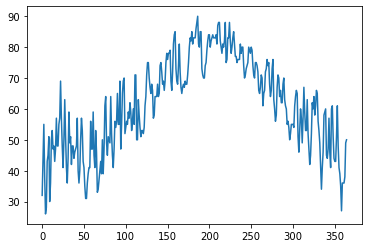

In [12]:
f = open('files/NorfolkWeather1999_1.csv','r')
nw1999 = f.readlines()
f.close()

y1999 = []

for i in range(len(nw1999)):
    y1999.append(float(nw1999[i]))

x = range(len(nw1999))
plt.plot(x, y1999, label = '1999')
plt.show()

Now, input the 2018 data.

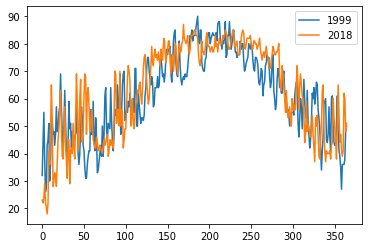

In [14]:
f = open('files/NorfolkWeather2018_1.csv','r')
nw2018 = f.readlines()
f.close()

y2018 = []

for i in range(len(nw2018)):
    y2018.append(float(nw2018[i]))

""" Plot both data series """
plt.plot(x, y1999, label = '1999')
plt.plot(x, y2018, label = '2018')
plt.legend()
plt.show()

## 2D Data Input

These files have two data elements per line, an index and a temperature, separated by commas.

- <code>NorfolkWeather1999.csv</code>
- <code>NorfolkWeather2008.csv</code>

We'll need to take extra care to split the elements of each line at the commas before we convert the data to numerical values.

Also, please not the improved method of opening files for input.  No <code>f.close()</code> statement is needed as the file is implicitly closed after completion of the code within the <code>with</code> block.  The same method can be used also when writing to files.

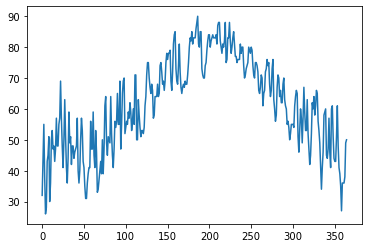

In [15]:
with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()

x = []
y1999 = []

for i in range(len(nw1999)):
    nw1999[i] = nw1999[i].strip()
    nw1999[i] = nw1999[i].split(',')
    x.append(int(nw1999[i][0]))
    y1999.append(float(nw1999[i][1]))

plt.plot(x, y1999, label = '1999')
plt.show()

Now, input the 2018 data.

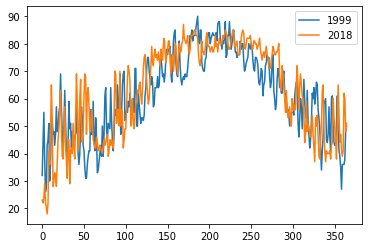

In [16]:
with open('files/NorfolkWeather2018.csv','r') as f:
    nw2018 = f.readlines()

y2018 = []

for i in range(len(nw2018)):
    nw2018[i] = nw2018[i].strip()
    nw2018[i] = nw2018[i].split(',')
    y2018.append(float(nw2018[i][1]))

""" Plot both data series """
plt.plot(x, y1999, label = '1999')
plt.plot(x, y2018, label = '2018')
plt.legend()
plt.show()

## Chaining Commands

The first improvement we will make to this code is to reduce its number of lines by chaining command, or executing multiple commands on the same line.

This can be done whenever a command returns the data that is being manipulated.  

For example, sorting a list does not return the sorted lsit but changes the list _in place_ where it resides in memory, whereas using <font style="font-family:'courier'">.strip()</font> and <font style="font-family:'courier'">.split()</font> does return the revise data, as shown below.

In [1]:
my_list = [9, 8, 7, 6]
my_list.sort()

In [2]:
my_list

[6, 7, 8, 9]

In [3]:
my_input = '1, 2, 3, 4, 5'
my_input.split()

['1,', '2,', '3,', '4,', '5']

Here is a version of the code with chained commands.  Do you think it is more or less readable?

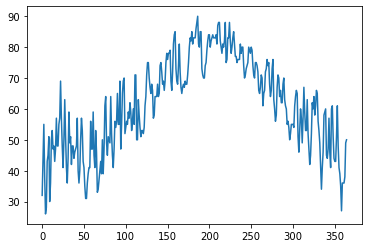

In [17]:
with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()

x = []
y1999 = []

for i in range(len(nw1999)):
    nw1999[i] = nw1999[i].strip().split(',')
    x.append(int(nw1999[i][0]))
    y1999.append(float(nw1999[i][1]))

plt.plot(x, y1999, label = '1999')
plt.show()

The two code blocks could be combined and the repetitive clean-up steps can be put into a function to clean up the code.  The function name <code>ssc()</code> is and acronym for strip, split, and convert.

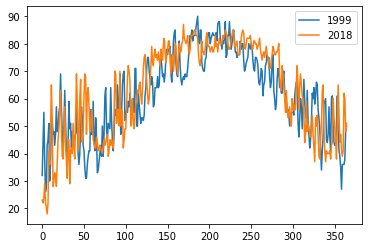

In [18]:
def ssc(data):
    x = []
    y = []
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        x.append(int(data[i][0]))
        y.append(float(data[i][1]))
    return x, y
    
with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()

with open('files/NorfolkWeather2018.csv','r') as f:
    nw2018 = f.readlines()

x, y1999 = ssc(nw1999)
x, y2018 = ssc(nw2018)
plt.plot(x, y1999, label = '1999')
plt.plot(x, y2018, label = '2018')
plt.legend()
plt.show()

We can clean up the code and reduce the chance of an error by using the <code>with</code> statement.

## The Moving Average

Let our time series data be collected for time indices $d \in \left\lbrace 0, ... , D-1 \right\rbrace$, where $d$ stands for the index for a given day. We will be considering daily time series for a year, so $D=365$.  A moving average, $ma_n(d)$ of $n$ days for day $d$ is defined as:

$ma_n(d) = \frac{1}{n} \Sigma_{i = d-n+1}^d t(i)$

where $t(d)$ is the average temperature for day $d$.  Note that $ma(d)$ is defined only for day in this range: $d \in \left\lbrace n-1, \ldots ,    D-1 \right\rbrace$.

Click on the image below to see a visualization of how a moving average is computed in a way that may be more clear than the math above.

[![Moving Average Animation](https://img.youtube.com/vi/rq__3P_rs4M/0.jpg)](https://www.youtube.com/watch?v=rq__3P_rs4M)

The files <font face = 'courier'>NorfolkWeather1999.csv</font> and <font face = 'courier'>NorfolkWeather2018.csv</font>  have the daily average temperatures for the years indicated in the filenames.  Load each of these text files into a list (load only the daily average temperature and not the row index), and then create new lists, <font face = 'courier'>ma1999</font> and <font face = 'courier'>ma2018</font>, that are 10-day moving averages of the original data.

Although we are not focusing on plotting in this session, we will compare the two moving average series using the <font face = 'courier'>matplotlib</font> package.

Let's compute and plot the moving averages of the two data series using <font face = 'courier'>for</font> loops and compare the two results.

In [ ]:
''' period: 
      * a variable representing the number of periods that are averaged together to create
        the moving average 
      * Given the zero-based indexing of Python, the first moving average can be computed
        in Period period - 1 '''
period = 10

ma1999 = []  # Initialize moving average list for 1999
ma2018 = []  # Initialize moving average list for 2018

for i in range(0, len(nw1999) - period + 1):
    ma1999.append(sum(nw1999[i:i + period])/period)
    ma2018.append(sum(nw2018[i:i + period])/period)

plt.plot(ma1999, label = '1999')
plt.plot(ma2018, label = '2018')
plt.legend()

plt.show()

## 2D Data Input: An Alternative

It is desirable, sometimes to keep both the <code>x</code> and <code>y</code> data in the same data structure, which we will do in the examples below using the same data.  Data can sometimes be used directly in this form, although we will need to process it further before plotting in our case. 

In [19]:
def ssc_2d(data):
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        data[i][0] = int(data[i][0])
        data[i][1] = float(data[i][1])
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999

[[0, 32.0],
 [1, 43.0],
 [2, 55.0],
 [3, 38.0],
 [4, 26.0],
 [5, 28.0],
 [6, 43.0],
 [7, 45.0],
 [8, 51.0],
 [9, 30.0],
 [10, 36.0],
 [11, 50.0],
 [12, 53.0],
 [13, 47.0],
 [14, 48.0],
 [15, 43.0],
 [16, 47.0],
 [17, 57.0],
 [18, 48.0],
 [19, 48.0],
 [20, 55.0],
 [21, 57.0],
 [22, 69.0],
 [23, 57.0],
 [24, 48.0],
 [25, 41.0],
 [26, 50.0],
 [27, 63.0],
 [28, 51.0],
 [29, 41.0],
 [30, 36.0],
 [31, 44.0],
 [32, 59.0],
 [33, 49.0],
 [34, 51.0],
 [35, 42.0],
 [36, 48.0],
 [37, 48.0],
 [38, 44.0],
 [39, 46.0],
 [40, 47.0],
 [41, 48.0],
 [42, 57.0],
 [43, 40.0],
 [44, 36.0],
 [45, 40.0],
 [46, 50.0],
 [47, 57.0],
 [48, 53.0],
 [49, 43.0],
 [50, 41.0],
 [51, 35.0],
 [52, 31.0],
 [53, 31.0],
 [54, 36.0],
 [55, 39.0],
 [56, 41.0],
 [57, 41.0],
 [58, 56.0],
 [59, 47.0],
 [60, 47.0],
 [61, 59.0],
 [62, 45.0],
 [63, 41.0],
 [64, 53.0],
 [65, 46.0],
 [66, 33.0],
 [67, 34.0],
 [68, 37.0],
 [69, 40.0],
 [70, 43.0],
 [71, 39.0],
 [72, 50.0],
 [73, 39.0],
 [74, 47.0],
 [75, 61.0],
 [76, 64.0],
 [77, 49.

This function is not flexible, however, and we would need to write a new function each time we wanted to convert data in an input file depaending on how many fields were in the data and what types we wanted to convert them to.  The conversion function can be made more flexible by supplying it with the data for conversion in the form of a dictionary its keys equal to the column indices as keys and its values indicating the data types.

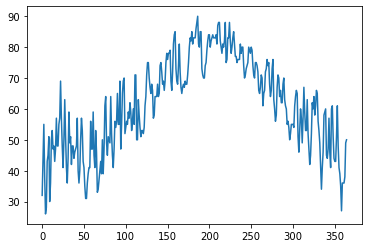

In [298]:
def ssc_2d_map(convert, data):
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        for j, mk_type in convert.items():
            data[i][j] = mk_type(data[i][j])
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
convert_map = {0:int, 1:float}
nw1999 = ssc_2d_map(convert_map, nw1999)

''' Create x and y series data '''
x = []
y1999 = []
for point in nw1999:
    x.append(point[0])
    y1999.append(point[1])
    
plt.plot(x, y1999, label = '1999')
plt.show()

Or, even better, let's use <code>zip()</code>.  Notice how much more readable the code is, providing you are familiar with <code>zip()</code>.

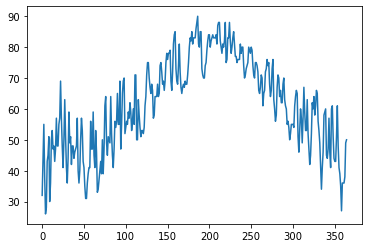

In [299]:
with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
convert_map = {0:int, 1:float}
nw1999 = ssc_2d_map(convert_map, nw1999)

''' Create x and y series data '''
x, y1999 = zip(*nw1999)
    
plt.plot(x, y1999, label = '1999')
plt.show()

## From Loops to List Comprehesion <a name='ListComprehension' />
Back to <a href = '#navigation'>Navigation</a>

List comprehension is a technique for condensing the number of statements required to create a new list using for loops.  

- More succinct code
- More readable code
- Faster than <code>for</code> loops

The cells immediately below demonstrate the simplest form of list comprehension.

In [11]:
import random
numElements = 10
newList = []

for i in range(numElements):
    newList.append(random.random())
newList

[0.2928597030542778,
 0.9270524879623784,
 0.0970768479915195,
 0.905487853822201,
 0.9155884907867351,
 0.54842618759238,
 0.7634497869224391,
 0.7813474433754127,
 0.1710840797423352,
 0.19486150198586705]

The method for compacting a for loop into a list comprehension state is illustrated below.

![List Comprehension Structure](images/listComprehension1.jpg)
![List Comprehension Example](images/listComprehension.jpg)

In [ ]:
import random
numElements = 10

newList1 = [random.random() for i in range(numElements)]
newList1

Logic can be applied within list comprehension statements to filter the elements appended to the list.

In [13]:
newList2 = []

for i in range(21):
    if i % 2 ==0:
        newList2.append(i)
newList2

[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]



![List Comprehension Structure w/Logic](images/listComprehension2.jpg)

For example, we could use the following code if we wanted to create a list of even numbers through 20.

In [14]:
newList3 = [i for i in range(21) if i%2 == 0]
newList3

[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]

Compound Boolean filtering logic can be used as well.

In [15]:
newList4 = [i for i in range(21) if i%2 == 0 and i>7]
newList4

[8, 10, 12, 14, 16, 18, 20]

More complex <code>if-elif-else</code> logic can be implemented, although having multiple levels can make the statement difficult to read.

Notice that the location of the Boolean statement changes when the <code>else</code> is introduced.

In [17]:
newList5 = [i if i % 2 == 0 else '' for i in range(21)]
newList5

[0, '', 2, '', 4, '', 6, '', 8, '', 10, '', 12, '', 14, '', 16, '', 18, '', 20]

In [20]:
data = [1, 2.1828, 'string', [0, 1, 2], (1,2), 2, 3.5]
newList6 = ['int' if isinstance(x, int) else 'float' if isinstance(x, float) else 'other' for x in data]
newList6

['int', 'float', 'other', 'other', 'other', 'int', 'float']

## Inputting Data and Computations with List Comprehension

The cell below refreshes our memory on one of the 2D functions for stripping, splitting, and converting data.  Let's revise it using list comprehension.

We will foreshadow our discussion on timing code with the use of the <code>%%timeit</code> function in two cells below.

In [20]:
%%timeit

def ssc_2d(data):
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        data[i][0] = int(data[i][0])
        data[i][1] = float(data[i][1])
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999

329 µs ± 3.64 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [15]:
def ssc_2d(data):
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
    data = [[int(data[i][0]), float(data[i][1])] for i in range(len(data))]
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999[:5]

[[0, 32.0], [1, 43.0], [2, 55.0], [3, 38.0], [4, 26.0]]

We can perform the list comprehension using a different type of <code>for</code> loop.  do you find this more readable?

In [16]:
def ssc_2d(data):
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
    data = [[int(point[0]), float(point[1])] for point in data]
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999[:5]

[[0, 32.0], [1, 43.0], [2, 55.0], [3, 38.0], [4, 26.0]]

We can also use list comprehension to strip and split the data.

In [17]:
def ssc_2d(data):
    data = [data[i].strip().split(',') for i in range(len(data))]
    data = [[int(point[0]), float(point[1])] for point in data]
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999[:5]

[[0, 32.0], [1, 43.0], [2, 55.0], [3, 38.0], [4, 26.0]]

or ...

In [18]:
def ssc_2d(data):
    data = [line.strip().split(',') for line in data]
    data = [[int(point[0]), float(point[1])] for point in data]
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999[:5]

[[0, 32.0], [1, 43.0], [2, 55.0], [3, 38.0], [4, 26.0]]

... or the following unless readibility suffers too greatly.

In [19]:
def ssc_2d(data):
    return [[int(point[0]), float(point[1])] for point in [line.strip().split(',') for line in data]]

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999[:5]

[[0, 32.0], [1, 43.0], [2, 55.0], [3, 38.0], [4, 26.0]]

or ...

## Computations with List Comprehension

The moving average computations with <code>for</code> loops can be done with list comprehension as well.

In [ ]:
period = 10

ma1999 = [sum(nw1999[i:i + period])/period for i in range(0,len(nw1999) - period + 1)]
ma2018 = [sum(nw2018[i:i + period])/period for i in range(0,len(nw2018) - period + 1)]

plt.plot(ma1999, label = '1999')
plt.plot(ma2018, label = '2018')
plt.legend()

plt.show()

In [21]:
%%timeit 

def ssc_2d(file_name):
    with open(file_name,'r') as f:
        data = [line.strip().split(',') for line in f.readlines()]
        data = [[int(point[0]), float(point[1])] for point in data]
        return data

filename = 'files/NorfolkWeather1999.csv'
nw1999 = ssc_2d(filename)
nw1999[:5]

288 µs ± 3.75 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


Note that using list comprehension is a bit faster than using <code>for</code> loops in this case.

# Other Comprehension Statements

## Dictionary Comprehension <a name='DictComp' />
Back to <a href = '#navigation'>Navigation</a>

Dictionaries provide for fast lookup of values based on (unique) keys associated with each value. 

We will create a dictionary from a text file, both with a for loop and with dictionary comprehension.

Each line of the file <font face = 'courier'>npNameLoc.txt</font> contains the name of a United States National Park and the state in which that park is located.  Read the file and create a dictionary where the key is the name of the park and the value is a string indicating the state in which the park is located.

## Dictionary Comprehension Basics <a name='DictComp' />
Back to <a href = '#navigation'>Navigation</a>

Dictionaries can be created with _dictionary comprehension_  just as lists can be generated with _list comprehension_.  The differences between list comprehension and dictioanry comprehension are that the latter uses curly braces rather than square brackets and the specification for what is appended to the dictionary requires both a key and a value, separated by a colon. One of many prototypical forms of dictionary comprehension is this:

<font face='courier'>newDictionary = {k:v for k,v in some_iterator}</font>

Dictionary comprehension is useful when filestreams are read, which need to be put into dictionaries, or if, for example, lists need to be converted to dictionaries.  For these demonstration, let's assume that we have a list of lists, where each sublist contains the name of a national parks and its acreage.  Let's construct a dictionary from this list of lists with the national park name as the key and the acreage as the value.

The first cells show multiple ways to use for loops for thsi task and the corresponding methods with dictionary comprehension.

Source: National Parks data was extracted from [Wikipedia National Parks page](https://en.wikipedia.org/wiki/List_of_national_parks_of_the_United_States).

In [ ]:
natParksList = [['Acadia',49075.26], ['Yellowstone',2219790.71], ['Yosemite',761747.5], ['Shenandoah',199223.77], \
                ['Saguro',91715.72], ['Petrified Forest',221390.21]]
natParksList

## Dictionaries from _for_ Loops
Back to <a href = '#navigation'>Navigation</a>

In [ ]:
natParksDict1 = {}
for i in range(len(natParksList)):
    natParksDict1[natParksList[i][0]] = natParksList[i][1]
natParksDict1

In [ ]:
natParksDict2 = {}
for x in natParksList:
    natParksDict2[x[0]] = x[1]
natParksDict2

In [ ]:
natParksDict3 = {}
for name,acreage in natParksList:
    natParksDict3[name] = acreage
natParksDict3

## Dictionaries with Dictionary Comprehension
Back to <a href = '#navigation'>Navigation</a>

The logic of unpacking a for loop and inserting the contents into a dictionary comprehension statement is the same as with list comprehension, except for tweaks that are appropriate for dictionaries: curly braces and specifying a key and a value to insert in each implicit iteration.

![Dictionary Comprehension Template](images/dictComp.jpg)

In [ ]:
natParksDict1DC = {natParksList[i][0]:natParksList[i][1] for i in range(len(natParksList))}
natParksDict1DC

In [ ]:
natParksDict2DC = {x[0]:x[1] for x in natParksList}
natParksDict2DC

In [ ]:
natParksDict3DC = {name:acreage for name,acreage in natParksList}
natParksDict3DC

In [ ]:
""" Read the data """
f_in = open('npNameLoc.txt','r')
data = f_in.readlines()
f_in.close()

""" Create the dictionary """
natParkDict1 = {}
for i in range(len(data)):
    data[i] = data[i].strip().split(',')
    natParkDict1[data[i][0]] = data[i][1]
natParkDict1

### Complete the task above with dictionary comprehension

At what point do fewer lines create code complexity that is difficult to read?

When do the simplifications cease and readability suffer?

In [112]:
""" Read the data """
f_in = open('npNameLoc.txt','r')
data = f_in.readlines()
f_in.close()

""" Create the dictionary """
for i in range(len(data)):
    data[i] = data[i].strip().split(',')
natParkDict1 = {data[i][0]:data[i][1] for i in range(1, len(data))}
natParkDict1

{'Acadia': 'Maine',
 'American Samoa': 'American Samoa',
 'Arches': 'Utah',
 'Badlands': 'South Dakota',
 'Big Bend': 'Texas',
 'Biscayne': 'Florida',
 'Black Canyon of the Gunnison': 'Colorado',
 'Bryce Canyon': 'Utah',
 'Canyonlands': 'Utah',
 'Capitol Reef': 'Utah',
 'Carlsbad Caverns': 'New Mexico',
 'Channel Islands': 'California',
 'Congaree': 'South Carolina',
 'Crater Lake': 'Oregon',
 'Cuyahoga Valley': 'Ohio',
 'Death Valley': 'California Nevada',
 'Denali': 'Alaska',
 'Dry Tortugas': 'Florida',
 'Everglades': 'Florida',
 'Gates of the Arctic': 'Alaska',
 'Gateway Arch': 'Missouri',
 'Glacier': 'Montana',
 'Glacier Bay': 'Alaska',
 'Grand Canyon': 'Arizona',
 'Grand Teton': 'Wyoming',
 'Great Basin': 'Nevada',
 'Great Sand Dunes': 'Colorado',
 'Great Smoky Mountains': 'Tennessee North Carolina',
 'Guadalupe Mountains': 'Texas',
 'Haleakal': 'Hawaii',
 'Hawaii Volcanoes': 'Hawaii',
 'Hot Springs': 'Arkansas',
 'Indiana Dunes': 'Indiana',
 'Isle Royale': 'Michigan',
 'Joshua Tr

In [113]:
""" Read the data """
with open('npNameLoc.txt','r') as f_in: 
    data = f_in.readlines()

""" Create the dictionary """
for i in range(len(data)):
    data[i] = data[i].strip().split(',')
natParkDict1 = {data[i][0]:data[i][1] for i in range(1, len(data))}
natParkDict1

{'Acadia': 'Maine',
 'American Samoa': 'American Samoa',
 'Arches': 'Utah',
 'Badlands': 'South Dakota',
 'Big Bend': 'Texas',
 'Biscayne': 'Florida',
 'Black Canyon of the Gunnison': 'Colorado',
 'Bryce Canyon': 'Utah',
 'Canyonlands': 'Utah',
 'Capitol Reef': 'Utah',
 'Carlsbad Caverns': 'New Mexico',
 'Channel Islands': 'California',
 'Congaree': 'South Carolina',
 'Crater Lake': 'Oregon',
 'Cuyahoga Valley': 'Ohio',
 'Death Valley': 'California Nevada',
 'Denali': 'Alaska',
 'Dry Tortugas': 'Florida',
 'Everglades': 'Florida',
 'Gates of the Arctic': 'Alaska',
 'Gateway Arch': 'Missouri',
 'Glacier': 'Montana',
 'Glacier Bay': 'Alaska',
 'Grand Canyon': 'Arizona',
 'Grand Teton': 'Wyoming',
 'Great Basin': 'Nevada',
 'Great Sand Dunes': 'Colorado',
 'Great Smoky Mountains': 'Tennessee North Carolina',
 'Guadalupe Mountains': 'Texas',
 'Haleakal': 'Hawaii',
 'Hawaii Volcanoes': 'Hawaii',
 'Hot Springs': 'Arkansas',
 'Indiana Dunes': 'Indiana',
 'Isle Royale': 'Michigan',
 'Joshua Tr

In [114]:
""" Read the data """
with open('npNameLoc.txt','r') as f_in: 
    data = f_in.readlines()
data = [line.strip().split(',') for line in data]

""" Create the dictionary """
natParkDict1 = {data[i][0]:data[i][1] for i in range(1, len(data))}
natParkDict1

{'Acadia': 'Maine',
 'American Samoa': 'American Samoa',
 'Arches': 'Utah',
 'Badlands': 'South Dakota',
 'Big Bend': 'Texas',
 'Biscayne': 'Florida',
 'Black Canyon of the Gunnison': 'Colorado',
 'Bryce Canyon': 'Utah',
 'Canyonlands': 'Utah',
 'Capitol Reef': 'Utah',
 'Carlsbad Caverns': 'New Mexico',
 'Channel Islands': 'California',
 'Congaree': 'South Carolina',
 'Crater Lake': 'Oregon',
 'Cuyahoga Valley': 'Ohio',
 'Death Valley': 'California Nevada',
 'Denali': 'Alaska',
 'Dry Tortugas': 'Florida',
 'Everglades': 'Florida',
 'Gates of the Arctic': 'Alaska',
 'Gateway Arch': 'Missouri',
 'Glacier': 'Montana',
 'Glacier Bay': 'Alaska',
 'Grand Canyon': 'Arizona',
 'Grand Teton': 'Wyoming',
 'Great Basin': 'Nevada',
 'Great Sand Dunes': 'Colorado',
 'Great Smoky Mountains': 'Tennessee North Carolina',
 'Guadalupe Mountains': 'Texas',
 'Haleakal': 'Hawaii',
 'Hawaii Volcanoes': 'Hawaii',
 'Hot Springs': 'Arkansas',
 'Indiana Dunes': 'Indiana',
 'Isle Royale': 'Michigan',
 'Joshua Tr

In [ ]:
""" Read the data """
with open('npNameLoc.txt','r') as f_in: 
    data = f_in.readlines()
data = [line.strip().split(',') for line in data]

""" Create the dictionary """
natParkDict1 = {data[i][0]:data[i][1] for i in range(1, len(data))}
natParkDict1

In [115]:
""" Read the data """
with open('npNameLoc.txt','r') as f_in: 
    data = [line.strip().split(',') for line in f_in.readlines()]

""" Create the dictionary """
natParkDict1 = {data[i][0]:data[i][1] for i in range(1, len(data))}
natParkDict1

{'Acadia': 'Maine',
 'American Samoa': 'American Samoa',
 'Arches': 'Utah',
 'Badlands': 'South Dakota',
 'Big Bend': 'Texas',
 'Biscayne': 'Florida',
 'Black Canyon of the Gunnison': 'Colorado',
 'Bryce Canyon': 'Utah',
 'Canyonlands': 'Utah',
 'Capitol Reef': 'Utah',
 'Carlsbad Caverns': 'New Mexico',
 'Channel Islands': 'California',
 'Congaree': 'South Carolina',
 'Crater Lake': 'Oregon',
 'Cuyahoga Valley': 'Ohio',
 'Death Valley': 'California Nevada',
 'Denali': 'Alaska',
 'Dry Tortugas': 'Florida',
 'Everglades': 'Florida',
 'Gates of the Arctic': 'Alaska',
 'Gateway Arch': 'Missouri',
 'Glacier': 'Montana',
 'Glacier Bay': 'Alaska',
 'Grand Canyon': 'Arizona',
 'Grand Teton': 'Wyoming',
 'Great Basin': 'Nevada',
 'Great Sand Dunes': 'Colorado',
 'Great Smoky Mountains': 'Tennessee North Carolina',
 'Guadalupe Mountains': 'Texas',
 'Haleakal': 'Hawaii',
 'Hawaii Volcanoes': 'Hawaii',
 'Hot Springs': 'Arkansas',
 'Indiana Dunes': 'Indiana',
 'Isle Royale': 'Michigan',
 'Joshua Tr

In [117]:
""" Read the data """
with open('npNameLoc.txt','r') as f_in: 
    data = [line.strip().split(',') for line in f_in.readlines()]

""" Create the dictionary """
natParkDict1 = {line[0]:line[1] for line in data[1:]}
natParkDict1

{'Acadia': 'Maine',
 'American Samoa': 'American Samoa',
 'Arches': 'Utah',
 'Badlands': 'South Dakota',
 'Big Bend': 'Texas',
 'Biscayne': 'Florida',
 'Black Canyon of the Gunnison': 'Colorado',
 'Bryce Canyon': 'Utah',
 'Canyonlands': 'Utah',
 'Capitol Reef': 'Utah',
 'Carlsbad Caverns': 'New Mexico',
 'Channel Islands': 'California',
 'Congaree': 'South Carolina',
 'Crater Lake': 'Oregon',
 'Cuyahoga Valley': 'Ohio',
 'Death Valley': 'California Nevada',
 'Denali': 'Alaska',
 'Dry Tortugas': 'Florida',
 'Everglades': 'Florida',
 'Gates of the Arctic': 'Alaska',
 'Gateway Arch': 'Missouri',
 'Glacier': 'Montana',
 'Glacier Bay': 'Alaska',
 'Grand Canyon': 'Arizona',
 'Grand Teton': 'Wyoming',
 'Great Basin': 'Nevada',
 'Great Sand Dunes': 'Colorado',
 'Great Smoky Mountains': 'Tennessee North Carolina',
 'Guadalupe Mountains': 'Texas',
 'Haleakal': 'Hawaii',
 'Hawaii Volcanoes': 'Hawaii',
 'Hot Springs': 'Arkansas',
 'Indiana Dunes': 'Indiana',
 'Isle Royale': 'Michigan',
 'Joshua Tr

In [118]:
''' Read the data and create the dictionary '''
with open('npNameLoc.txt','r') as f_in: 
    natParkDict1 = {line[0]:line[1] for line in [line.strip().split(',') for line in f_in.readlines()][1:]}
natParkDict1

{'Acadia': 'Maine',
 'American Samoa': 'American Samoa',
 'Arches': 'Utah',
 'Badlands': 'South Dakota',
 'Big Bend': 'Texas',
 'Biscayne': 'Florida',
 'Black Canyon of the Gunnison': 'Colorado',
 'Bryce Canyon': 'Utah',
 'Canyonlands': 'Utah',
 'Capitol Reef': 'Utah',
 'Carlsbad Caverns': 'New Mexico',
 'Channel Islands': 'California',
 'Congaree': 'South Carolina',
 'Crater Lake': 'Oregon',
 'Cuyahoga Valley': 'Ohio',
 'Death Valley': 'California Nevada',
 'Denali': 'Alaska',
 'Dry Tortugas': 'Florida',
 'Everglades': 'Florida',
 'Gates of the Arctic': 'Alaska',
 'Gateway Arch': 'Missouri',
 'Glacier': 'Montana',
 'Glacier Bay': 'Alaska',
 'Grand Canyon': 'Arizona',
 'Grand Teton': 'Wyoming',
 'Great Basin': 'Nevada',
 'Great Sand Dunes': 'Colorado',
 'Great Smoky Mountains': 'Tennessee North Carolina',
 'Guadalupe Mountains': 'Texas',
 'Haleakal': 'Hawaii',
 'Hawaii Volcanoes': 'Hawaii',
 'Hot Springs': 'Arkansas',
 'Indiana Dunes': 'Indiana',
 'Isle Royale': 'Michigan',
 'Joshua Tr

## Set Comprehension

A <code>set</code> is a Python data type that contains unique items, that is, no element can be repeated.  These, too, can be created with a comprehension statement.  This data type can be viewed as a set of dictionary keys without values.

In [108]:
my_set = set([0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 5])
my_set

{0, 1, 2, 3, 4, 5}

In [109]:
my_list = [0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 5]
my_set1 = {x for x in my_list}
my_set1

{0, 1, 2, 3, 4, 5}

# Comprehension Statement Exercises

# Measuring Execution Time and Memory Consumption 

We will demonstrate these techniques for measuring execution time:
- Various applications of the built-in <code>timeit</code> command
- The <code>line_profiler</code> package

We will demonstrate these techniques for measuring memory usage:
- The <code>memit</code> command
- The <code>memory_profiler</code> package

The usage of these techniques varies depending on what context one uses them in, whether it be in Jupyter, in spyder, or on the command line.  Some do not work well in Jupyter, if at all.

__Warning:__ Before using <code>%%timeit</code> to measure cell execution time ensure that the cell runs correctly first.  

## Execution Time

First, let's take a look at:
- <code>%timeit</code> to measure execution time of one _statement_
- <code>%%timeit</code> to measure execution time of one _cell_

In [131]:
x = 2
%timeit y = x**2

146 ns ± 0.712 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)


In [43]:
%%timeit

x = []
for i in range(1000):
    x.append(random.random())

119 µs ± 1.18 µs per loop (mean ± std. dev. of 7 runs, 10000 loops each)


In [44]:
%%timeit

x = [random.random() for i in range(1000)]

83 µs ± 574 ns per loop (mean ± std. dev. of 7 runs, 10000 loops each)


<code>%%timeit</code> does not break down execution time line-by-line, but <code>line_profiler</code> does, but it requires installation with this statemment in an Anaconda Command prompt run as an administrator:

<code>conda install -c conda-forge line_profiler</code>

Once installed, <code>line_profiler</code> is loaded into the Jupyter notebook with teh statemment int he following cell.

In [132]:
%load_ext line_profiler

Once loaded, two methods of using <code>line_profiler</code> are demonstrated below.

The first is this, using what is called a function decorator.  There are a couple new things in this cell, which we will describe.

Having defined a line profiler object with <code>lp = LineProfiler()</code>, the <code>lp</code> function wrapper can be applied multiple times to multiple functions and the execution times are accumulated in the reported statistics, which are obtained with the <code>lp.print_stats()</code> statement.

In [137]:
from line_profiler import LineProfiler
import numpy as np

def make_list(n):
    x = np.random.random(n)
    return x

if __name__ == '__main__':
    lp = LineProfiler()
    lp_wrapper = lp(make_list)
    lp_wrapper(100_000)
    lp.print_stats()

Timer unit: 1e-07 s

Total time: 0.0006065 s
File: <ipython-input-137-5b6d3cd6a540>
Function: make_list at line 4

Line #      Hits         Time  Per Hit   % Time  Line Contents
     4                                           def make_list(n):
     5         1       6059.0   6059.0     99.9      x = np.random.random(n)
     6         1          6.0      6.0      0.1      return x



The second method requires taht a function be defined and then calling <code>line_profiler</code> with <code>%lprun</code>.

The output does not appear within the Jupyter notebook, but in a window that pops up at the bottom of thenotebook.

In [134]:
def make_list_1(n):
    x = np.random.random(n)
    return x

In [138]:
%lprun -f make_list_1 make_list_1(100_000)

The execution time documented line by line points out the most time consuming steps, which are targets for coding improvements to reduce execution time.

## Memory Usage Profiling

Measuring memory usage requires that the <code>conda install -c conda-forge memory_profiler</code> package be installed in an Anaconda command prompt run as an administrator with this command:

<code>conda install -c conda-forge memory_profiler</code>

Once installed, the <code>memory_profiler</code> package needs to be loaded into the Jupyter notebook with this command:

<code>%load_ext memory_profiler</code>

In [139]:
%load_ext memory_profiler

### <code>%%memit</code>

This gives a quick, but not detailed indication of memory usage in Jupyter.  It reports the total memory required to execute code in a cell.

It is best to delete variables used in a cell that is measured.  Otherwise, the incremental memory usage reported will reflect only the incremental increase in such variables already in use.

In [148]:
try:
    del x
except:
    pass

In [149]:
%%memit

x = []
for i in range(1_000_000):
    x.append(random.random())

peak memory: 503.87 MiB, increment: 8.09 MiB


In [156]:
try:
    del y
except:
    pass

In [157]:
%%memit

y = [random.random() for i in range(1_000_000)]

peak memory: 524.66 MiB, increment: 15.32 MiB


### <code>memory_profiler</code>

This package gives memory usage line-by-line and, therefore, provides much advantage over <code>%%memit</code> in pinpointing areas of opportunity.

<code>memory_profiler</code> must be installed with this command in an Anaconda command prompt run as an administrator:

<code>conda install -c conda-forge memory_profiler</code>

The <code>memory_profiler</code> can be run in Jupyter, although I strongly discourage that for myriad reasons including frequent results that clearly cannot be true and needing to create a <code>.py</code> code file outside of Jupyter to be analyzed.  

So, if you need to create a code file outside of Jupyter, then it makes sense to run <code>memory_profiler</code> either on the command line or in Spyder, as detailed below.

### <code>memory_profiler</code>  on the Command Line 

<code>memory_profiler</code> can analyze only code that is contained in a function.  Here is how it is applied to a function <code>make_rnd()</code> within a file <code>rnd.py</code>, which is contained in the same folder as this Jupyter notebook.

![rnd_py.jpg](images/rnd_py.jpg)

Of note in the code are these:
- The <code>profile</code> function is imported from <code>memory_profiler</code> with an alias of <code>mem_profile</code>.  (The alias is used to keep the <code>memory_profiler</code> <code>profile</code> function distinct from that same name for the <code>line_profiler</code> package.
- The 'decorator' <code>@mem_profile</code> on the <code> make_rnd()</code> function.  It is beyond the scope of this course to describe function decorators, but it suffices to understand that the decorator specifies which function is to eb profiled.

Here is the result:
![rnd_py_cmd_prmpt.jpg](images/rnd_py_cmd_prmpt.jpg)

Alternatively, one does not need to import <code>memory_profiler</code> within the code file if this command line command is used, although the default decorator <code>profile</code> must be used:
![rnd1_py.jpg](images/rnd1_py.jpg)
![rnd1_py_cmd_prmpt.jpg](images/rnd1_py_cmd_prmpt.jpg)

### <code>memory_profiler</code> in Spyder

The previously mentioned file <code>rnd.py</code> can be run directly in a Spyder environment provided that <code>memory_profiler</code> is installed in Anaconda.

![rnd_spyder.jpg](images/rnd_spyder.jpg)

# Iterables, Iterators, and Generators

## Iterables

These are data types that hold collections of elements and are capable of returning those elements one at a time, for example, in <code>for</code> loops and list comprehension statements.  Of the basic Python data types, these are iterable:

- list
- tuple
- dictionary
- set
- string

The cells below illustrate how these data types are iterable in a <code>for</code> loop.

In [204]:
my_list = [0, 1, 2]
my_tup = (0, 1, 2)
my_dct = {0:'zero', 1:'one', 2:'two'}
my_set = {0, 1, 2}
my_str = 'hello'

In [205]:
for e in my_list:
    print(e)

0
1
2


In [183]:
for e in my_list:
    print(e)

[0, 1]

In [206]:
for e in my_tup:
    print(e)

0
1
2


In [207]:
for e in my_dct:
    print(e)

0
1
2


In [208]:
for e in my_dct.items():
    print(e)

(0, 'zero')
(1, 'one')
(2, 'two')


In [209]:
for e in my_set:
    print(e)

0
1
2


In [210]:
for e in my_str:
    print(e)

h
e
l
l
o


## Iterators

Iterators are like iterables in that they can present their elements one at a time, but they are different from iterables in these ways:
- Only a single pass is permitted through the iterable, retrieving each of the elements once in sequence.
- Once exhausted, no further elements can be retrieved from an iterator without re-creating it.
- Once exhausted, the iterator returns an <code>StopIteration</code> exception which is gracefully handled (you won't see evidence of it) when iterators are used in <code>for</code> loops, for example.
- The next iterator element can be retrieved using the <code>next()</code> function.

The built-in <code>iter()<code> function creates an iterator from a data type that is a collection of elements.  The cells below illustrate the characteristics above.

In [214]:
it = iter(my_list)

In [215]:
print(next(it))
print(next(it))
print(next(it))
print(next(it))

0
1
2


StopIteration: 

This code cell, if executed immediately after the cell above will return nothing because the iterator is exhausted.  It needs to be reset being using it again.

Notice that rather than seeing an exception/error, instead nothing happens. 

In [216]:
for i in it:
    print(i)

In [217]:
it = iter(my_list)
for i in it:
    print(i)

0
1
2


In [218]:
it = iter(range(3))
for i in it:
    print(i)
next(it)

0
1
2


StopIteration: 

We will see that the motivation for using iterators and generators are their speed and memory performance.

## Generators

Generators are a type of iterator.  They have all the characteristics of iterators noted above and, in addition, they create a stream of elements with a _function_ rather than repeating the elements from an existing data structure.

Generators can be defined in two ways:
- With a function
- With a comprehension statement

Our first example is a function taht generates the Fibonacci sequence, one term at a time.  If $f_0 = 1$ and $f_1 = 1$  are the first two terms in the Fibonacci sequence, then the reqmaining terms are defined by:

$f_i = f_{i-1} + f_{i-2}$,

so that the Fibonacci sequence starts with

$f = 1,1,2,3,5,8,13,21,34, ...$.

A generator function is just like a regular custom function except that it uses <code>yield</code> rather than <code>return</code> to send values back to the calling statement.  <code>yield</code> return a value or values from one iteration of the function, and then causes the function to pause until it is called next.  When called again, the function will pick up by executing its next statement having remembered the values of all its variables.

In [219]:
''' Compute n terms of the Fibonacci sequence '''
def fib(n):
    t1, t2 = 1, 1
    counter = 1
    yield t1
    
    while counter <= n:
        counter += 1
        t1, t2 = t2, t1 + t2
        yield t1

Note that two assignments can be executed on the same line, as is done twice in the code above.  

In [220]:
[x for x in fib(7)]

[1, 1, 2, 3, 5, 8, 13, 21]

The yield statement automatically causes the <code>StopIteration</code> exception once the function terminates, as demonstrated in the next cell.

List comprehension and <code>for</code> loops handle the <code>StopIteration</code> exception gracefully.  That is, they simply stop when the exception is encountered without alerting you to it.

In [222]:
f = fib(7)
while True:
    print(next(f))

1
1
2
3
5
8
13
21


StopIteration: 

Generators may be infinite.

In [223]:
''' Compute an infinite number of terms of the Fibonacci sequence '''
def fib_1():
    t1, t2 = 1, 1
    counter = 1
    yield t1
    
    while True:
        counter += 1
        t1, t2 = t2, t1 + t2
        yield t1

In [226]:
f = fib_1()
[next(f) for _ in range(8)]

[1, 1, 2, 3, 5, 8, 13, 21]

In [227]:
''' The generator is still active '''
next(f)

34

Generators may be constructed using comprehension statements, just like lists, dictionaries, and sets by specifying the parameters within parentheses.

In [228]:
g = ((i, i**2) for i in range(7))

In [229]:
[x for x in g]

[(0, 0), (1, 1), (2, 4), (3, 9), (4, 16), (5, 25), (6, 36)]

In [230]:
g = ((i, i**2) for i in range(7))
while True:
    print(next(g))

(0, 0)
(1, 1)
(2, 4)
(3, 9)
(4, 16)
(5, 25)
(6, 36)


StopIteration: 

# Text File Input with Base Python Generators

Why read files with a generator?

__Large files can be read faster by generators while using less memory for holding the entire file contents at once as is done with base Python statements__

We will demonstrate the speed advantage in the subsequent code cells by, first, creating a larger text file to read.

## Create Large Data File

Create a version of Norfolk weather file that is 1M+ lines long.

In [ ]:
with open('files/NorfolkWeather1999.csv', 'r') as f:
    data = f.read()
    
with open('files/NorfolkWeatherLong.csv', 'w') as f: 
    f.write('\n'.join(data for _ in range(3000)))

If you prefer, the cell below creates 1M lines of random temperatures.

In [ ]:
import random

with open('files/NorfolkWeatherLong.csv', 'w') as f:
    f.write('\n'.join([str(i) + ',' + str(100*random.random()) for i in range(1_000_000)]))

## Typical Base Python Method

... which takes approximately 1 second to read a large code file.

In [269]:
%%timeit 

def ssc_2d(file_name):
    with open(file_name,'r') as f:
        data = [line.strip().split(',') for line in f.readlines()]
        data = [[int(point[0]), float(point[1])] for point in data]
        return data

filename = 'files/NorfolkWeatherLong.csv'
nw1999 = ssc_2d(filename)

982 ms ± 7.08 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


## Large File Input with Base Python Generators

The code in the cell below returns a generator that provides access to the text file data.

It is almost 10X faster than using list comprehension.

In [270]:
%%timeit

def ssc_2d(filename):
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        data = ((int(point[0]), float(point[1])) for point in data)
    return data

x = ssc_2d('files/NorfolkWeatherLong.csv')

101 ms ± 599 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


We still haven't demonstrated how to use generators to minimize memory usage, but we will do that shortly.

Also, these execution times are for only the reading of the data.  We must also consider the ultimate task for which we are inputting the data and the total effect on execution time of using generators.

Nonetheless, these quick demonstrations hint at the power and value of generators.

Let's consider one use case where we want to plot the first 365 lines of <code>NorfolkWeatherLong.csv</code> (the first year), and let's compare the speed of base Python versus generators.  As previously mentioned, <code>matplotlib</code> will not plot generators, so we need to present it was a list (<code>numpy</code> arrays and <code>pandas</code> series work as well).  when using generators, it is best to convert the generator to a list at the ltest possible pint, which in this case is in the <code>matplotlib</code> <code>plot()</code> statement.

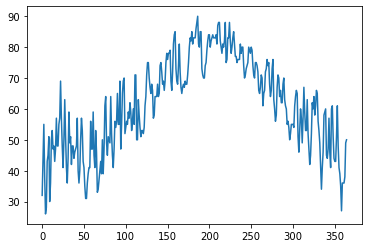

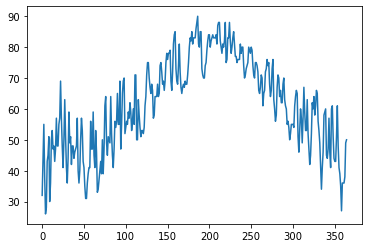

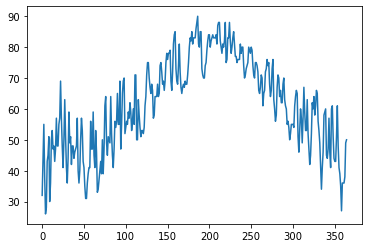

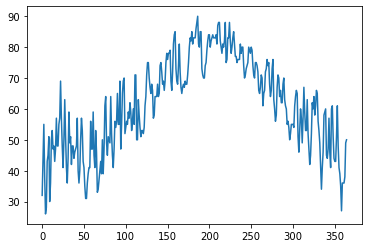

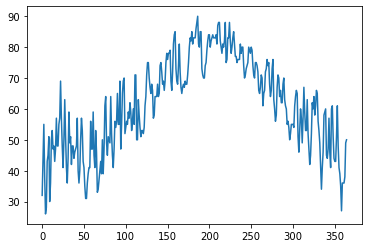

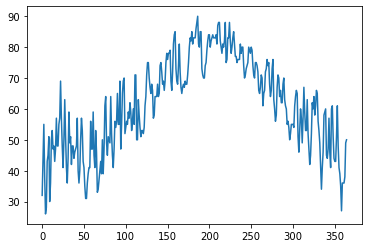

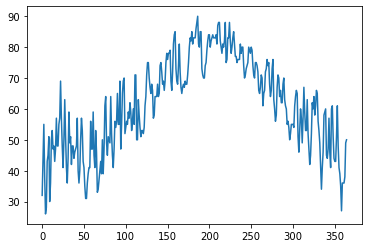

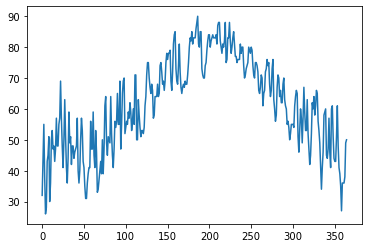

1.21 s ± 22.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [271]:
%%timeit

def ssc_2d(data):
    x = []
    y = []
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        x.append(int(data[i][0]))
        y.append(float(data[i][1]))
    return x, y

with open('files/NorfolkWeatherLong.csv','r') as f:
    nw1999 = f.readlines()
x, y = ssc_2d(nw1999)

plt.plot(x[:365],y[:365])
plt.show()

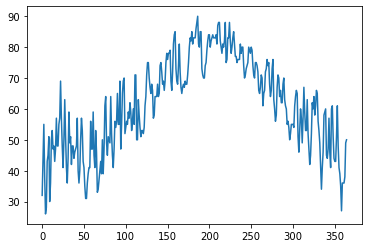

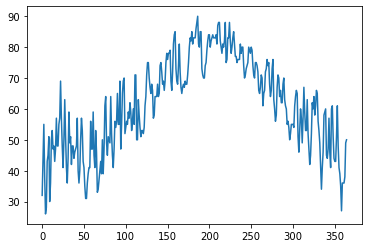

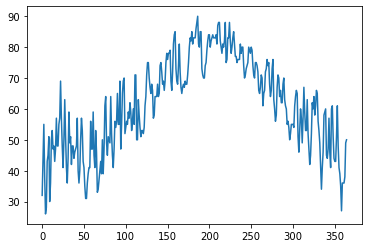

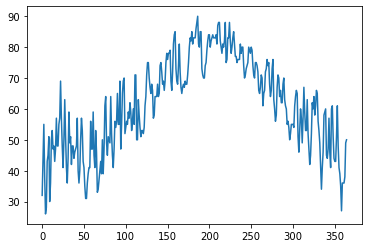

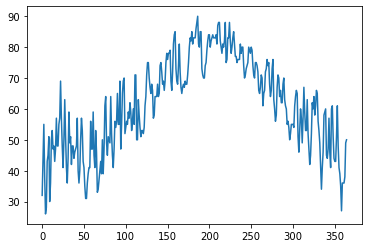

...

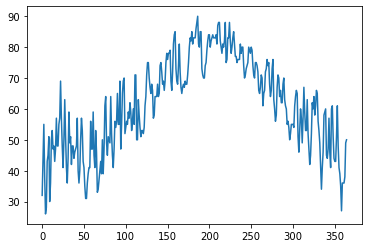

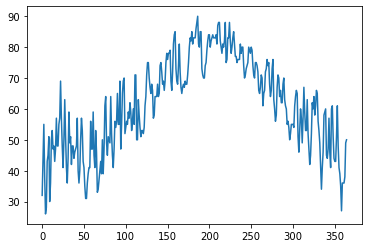

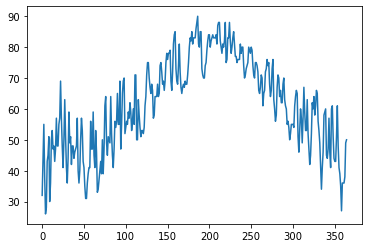

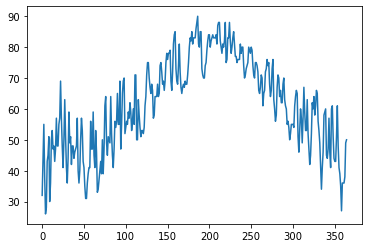

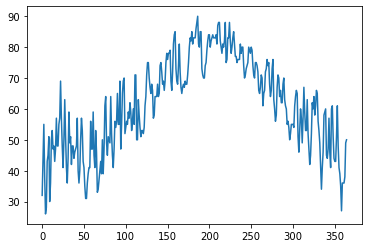

202 ms ± 3.1 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [272]:
%%timeit

from itertools import islice

def ssc_2d(filename):
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        data = ((int(point[0]), float(point[1])) for point in data)
    return data

x = ssc_2d('files/NorfolkWeatherLong.csv')

plt.plot(*zip(*islice(x, 0, 365)))
plt.show()

Generators provide access text file data and plot it __6X__ faster!

What do <code>\*zip()</code> and <code>\*islice()</code> do?
- <code>*zip()</code> separates the $x$ and $y$ data, which the <code>ssc_2d()</code> returns as tuples for each data point.
- <code>islice()</code> is the slice operator for generators akin the the <code>my_list[start:stop:step]</code> statement for lists.  Here, <code>islice()</code> selects the first 365 data points.  This is much faster than transforming the entire generator to a list and then slicing.

Multiple graphs are displayed because <code>%%timeit</code> executes the code multiple times as it profiles its execution time.

## Generators and Computations on Large Text Files

The previous example of plotting text file data is not the situation where generators are most beneficial.  They are faster relative to base Python methods when computations are done on data in text files, _providing that the computation can be done without holding the entire set in memory_.

When an entire data set cannot be held in memory, then generators make it possible to handle these large data sets without crashing the computer.  In this case computation strategies must be found to handle the data in chunks.  Computing the data in chunks avoids the problem of overloading computer memory if all the data were to be loaded at once.

### One-pass versus Two-pass Computations

A formula typical used to computer the variance of a series of $n$ values is:

$ \sum_{i=0}^{n-1}{\left( x_i - \bar{x} \right)^2}$.

This computation requires that we know the mean of $x$, $\bar{x}$ prior to summing the squared differences.  When the data is in a list (in memory), this is easy.

In [281]:
import random

n = 10
x = [i for i in range(n)]
x_bar = sum(x) / n
x_var = sum([(z - x_bar)**2 for z in x])
print(f'Variance: {x_var: .2f}')

Variance:  82.50


Computing the <code>sum()</code> of generator exhausts the generator and so no data remains in <code>x</code> to tierate over and so <code>x_var</code> ends up being zero which is incorrect.  The generator needs to be reset in order to make this second computation and so using a generator makes this a _two-pass_ computation

In [280]:
n = 10
x = (i for i in range(n))
x_bar = sum(x) / n
x_var = sum([(z - x_bar)**2 for z in x])
print(f'Variance: {x_var: .2f}')

Variance:  0.00


In [282]:
n = 10
x = (i for i in range(n))
x_bar = sum(x) / n

x = (i for i in range(n))
x_var = sum([(z - x_bar)**2 for z in x])
print(f'Variance: {x_var: .2f}')

Variance:  82.50


Novel approaches to computations, which are sometimes approximations, can be used to avoid making two passes.

In other cases, making two passes may be the best alternative and sufficiently fast given that generators are being used.  When data are large, using lists and putting the entire data set in emmory is not a feasible alternative.

For now, let's start investigate generator speed with a computation that takes just one pass, which is computing a frequency histogram.

The data we will use is on New York City taxis and it size is about 5.5GB.  

[NYC Taxi Cab Data](https://www.kaggle.com/c/new-york-city-taxi-fare-prediction/data)

This data is not large enough to necessarily crash your computer, but loading it all could be very slow and cause your comptuer to continually swap data between the hard drive and memory, which is very slow.  

The downsides and weaknesses of generators are due to entire file contents not being held in memory at any one time:
- Any processing of the file contents must be done in chunks
- Any portion of the input data that will be plotted in <code>matplotlib</code> must be in a list or similar data struture.
  - <code>matplotlib</code> does not take generators

This code reads one line at a time, although the best performing generators read files in larger _chunks_.

We could optimize inputting a text file using the base Python <code>open()</code> statement by finding the best _chunk size_ (number of lines) to read in each iteration, which I have done in the code cells below.  But, the <code>pandas</code> package permits us to read files in _chunks_ and permits us to create a generator to do so, as we demonstrate in the next section.

xxx insert optimized input code xxx

## Text File Input with pandas using <code>chunksize</code>

### Large File Input with base Python Generators

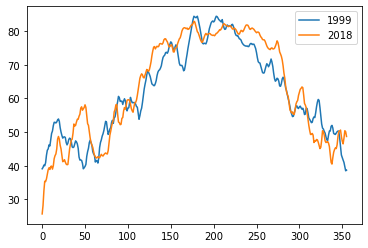

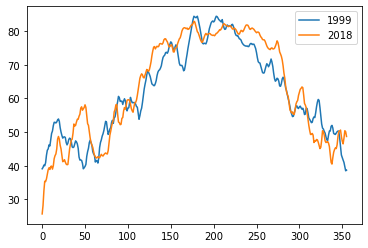

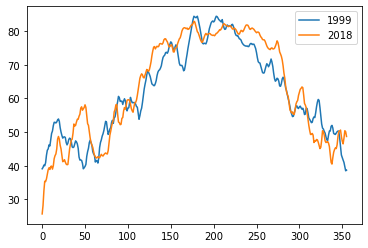

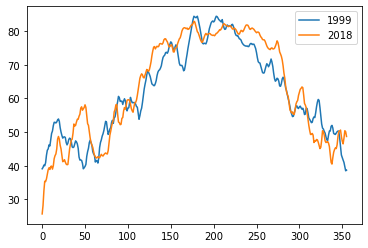

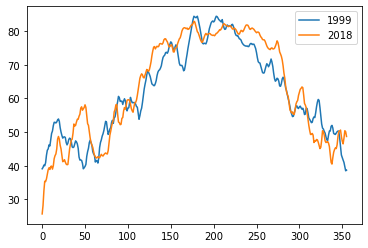

...

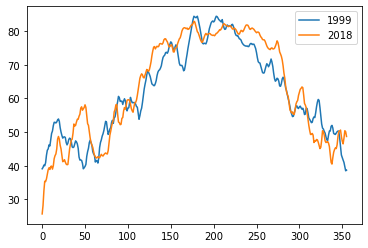

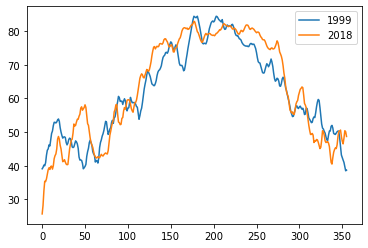

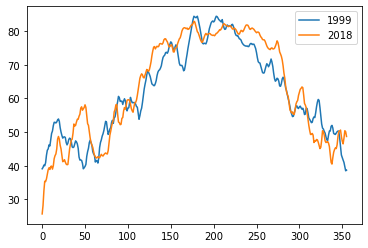

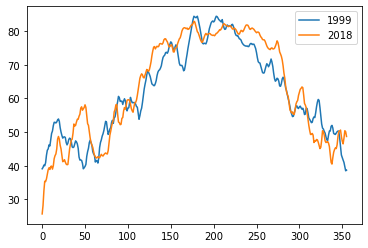

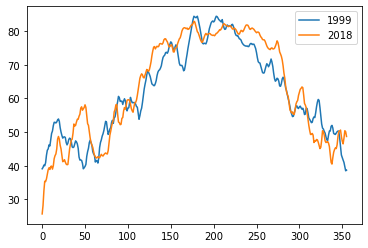

99.8 ms ± 859 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [33]:
%%timeit

period = 10

ma1999 = [sum(nw1999[i:i + period])/period for i in range(0,len(nw1999) - period + 1)]
ma2018 = [sum(nw2018[i:i + period])/period for i in range(0,len(nw2018) - period + 1)]

plt.plot(ma1999, label = '1999')
plt.plot(ma2018, label = '2018')
plt.legend()

plt.show()

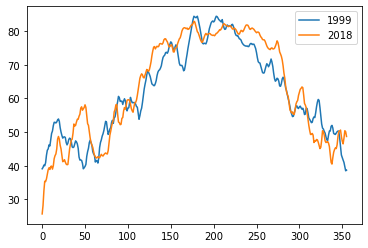

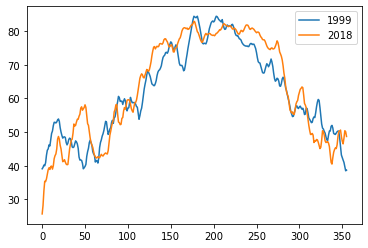

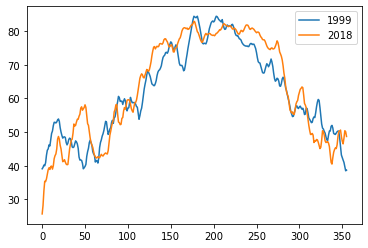

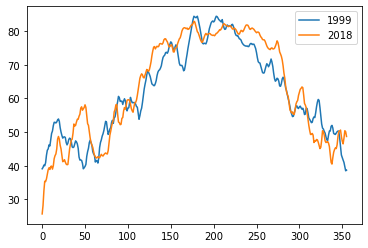

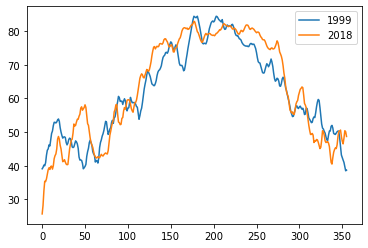

...

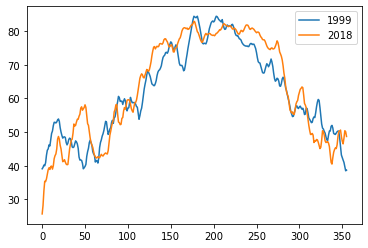

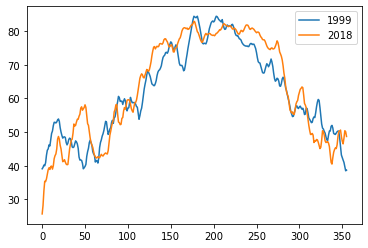

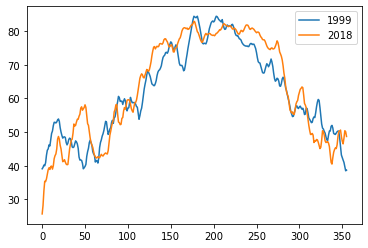

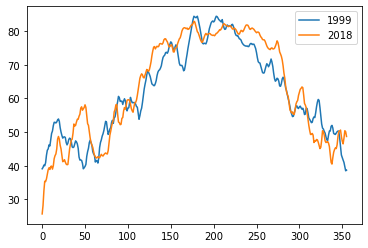

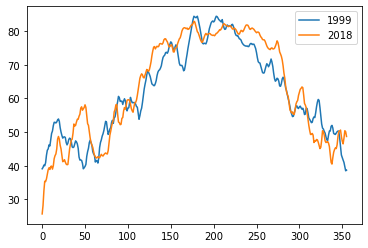

100 ms ± 1.12 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [35]:
%%timeit

period = 10

ma1999 = (sum(nw1999[i:i + period])/period for i in range(0,len(nw1999) - period + 1))
ma2018 = (sum(nw2018[i:i + period])/period for i in range(0,len(nw2018) - period + 1))

plt.plot([*ma1999], label = '1999')
plt.plot([*ma2018], label = '2018')
plt.legend()

plt.show()

xxx revise xxx The cells above demonstrate how iterators can substantially speed up the inputting of data, but not necessarily the speed of the total job of producing a graph because <code>matplotlib</code> does not accept iterators or generators for the data to be plotted.

With 1D data structure

In [ ]:
import random

with open('files/NorfolkWeatherLong_1.csv', 'w') as f:
    f.write('\n'.join([str(100*random.random()) for i in range(1_000_000)]))

In [ ]:
%%timeit

def ssc_2d(filename):
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        x = (int(x[0]) for x in data)
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        y = (float(x[1]) for x in data)
    return x, y #points

x, y = ssc_2d('files/NorfolkWeatherLong.csv')

Other base Python read methods

The next four cells show that typical input methods with base Python statements take on the order of 1 second to input 1M rows of data.

In [264]:
%%timeit

def ssc_2d(data):
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        data[i][0] = int(data[i][0])
        data[i][1] = float(data[i][1])
    return data

with open('files/NorfolkWeatherLong.csv','r') as f:
    nw1999 = f.readlines()
nw1999 = ssc_2d(nw1999)
nw1999

916 ms ± 6.93 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [263]:
%%timeit 

def ssc_2d(file_name):
    with open(file_name,'r') as f:
        data = [line.strip().split(',') for line in f.readlines()]
        data = [[int(point[0]), float(point[1])] for point in data]
        return data

filename = 'files/NorfolkWeatherLong.csv'
nw1999 = ssc_2d(filename)

990 ms ± 9.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [265]:
%%timeit

def ssc_2d(data):
    x = []
    y = []
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        x.append(int(data[i][0]))
        y.append(float(data[i][1]))
    return x, y

with open('files/NorfolkWeatherLong.csv','r') as f:
    nw1999 = f.readlines()
x, y = ssc_2d(nw1999)

979 ms ± 7.42 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [266]:
%%timeit

def ssc_2d(data):
    data = [line .strip().split(',') for line in data]
    x = [int(x[0]) for x in data]
    y = [float(x[1]) for x in data]
    return x, y

with open('files/NorfolkWeatherLong.csv','r') as f:
    nw1999 = f.readlines()
x, y = ssc_2d(nw1999)

969 ms ± 8.03 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


The code in the cell below returns a generator that provides access to the text file data.

In [267]:
%%timeit

def ssc_2d(filename):
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        data = ((int(point[0]), float(point[1])) for point in data)
    return data

x = ssc_2d('files/NorfolkWeatherLong.csv')

102 ms ± 778 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


Data acquisition and plotting

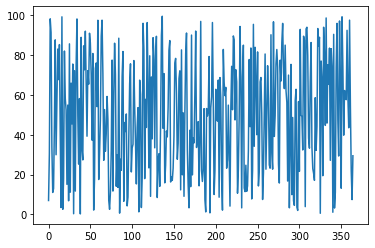

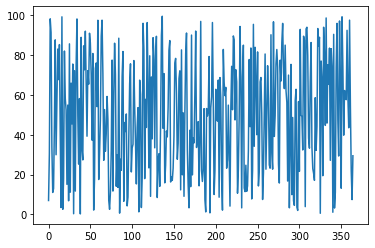

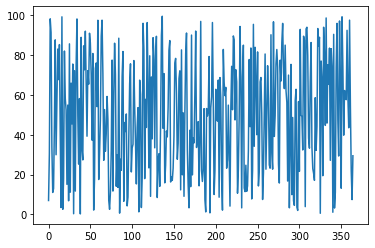

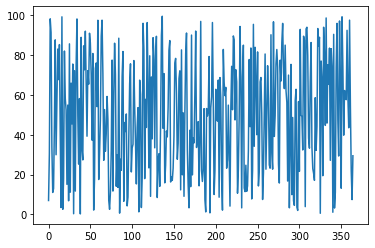

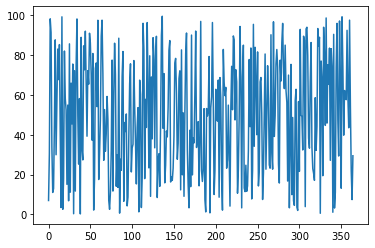

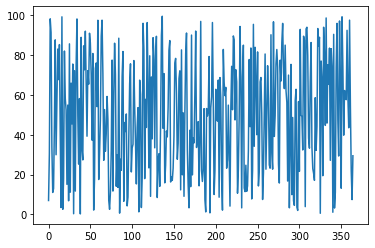

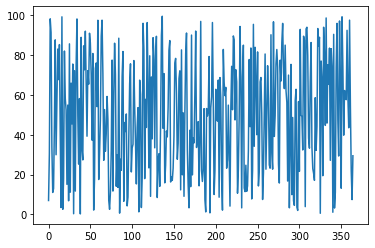

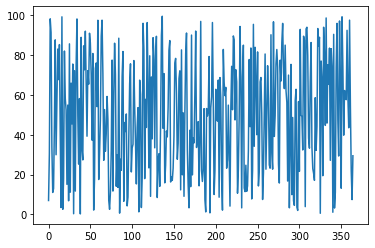

1.31 s ± 18.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [123]:
%%timeit

def ssc_2d(data):
    x = []
    y = []
    for i in range(len(data)):
        data[i] = data[i].strip().split(',')
        x.append(int(data[i][0]))
        y.append(float(data[i][1]))
    return x, y

with open('files/NorfolkWeatherLong.csv','r') as f:
    nw1999 = f.readlines()
x, y = ssc_2d(nw1999)

plt.plot(x[:365],y[:365])
plt.show()

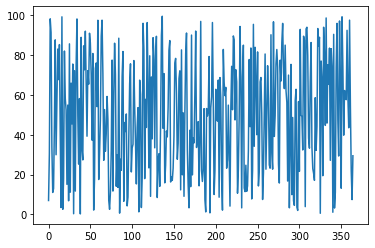

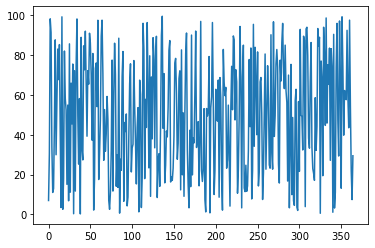

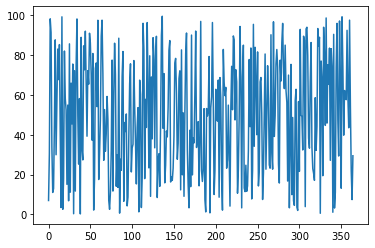

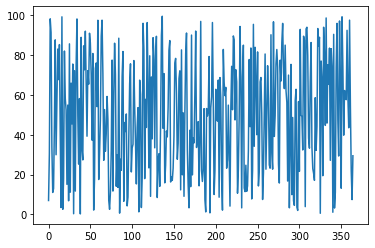

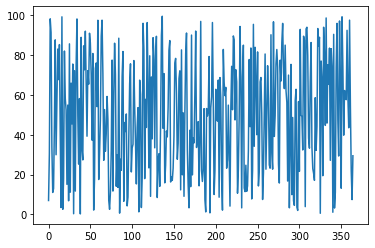

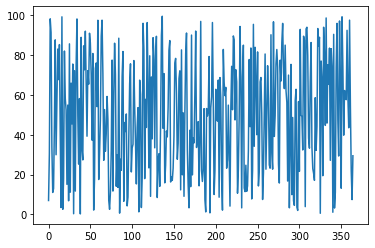

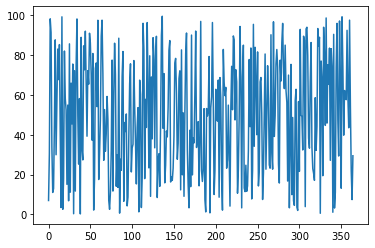

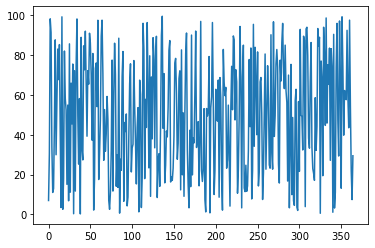

1.35 s ± 17.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [126]:
%%timeit 

def ssc_2d(file_name):
    with open(file_name,'r') as f:
        data = [line.strip().split(',') for line in f.readlines()]
        data = [[int(point[0]), float(point[1])] for point in data]
        return data

filename = 'files/NorfolkWeatherLong.csv'
nw1999 = ssc_2d(filename)
x = [p[0] for p in nw1999] 
y = [p[1] for p in nw1999] 
plt.plot(x[:365],y[:365])
plt.show()

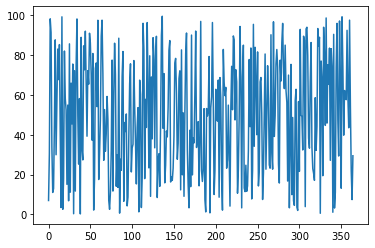

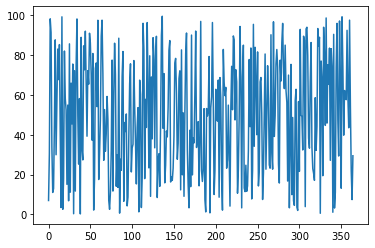

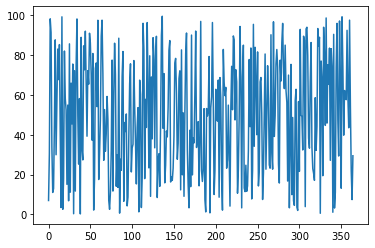

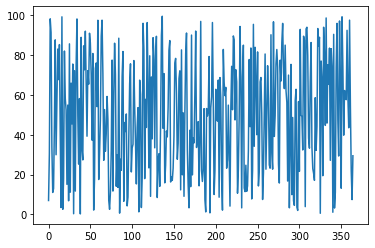

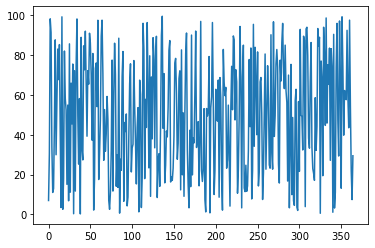

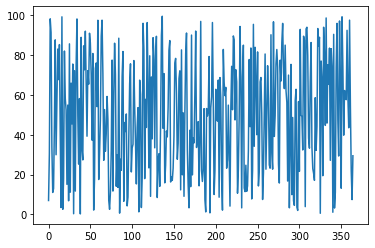

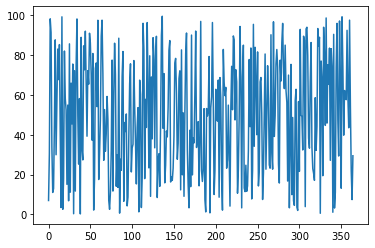

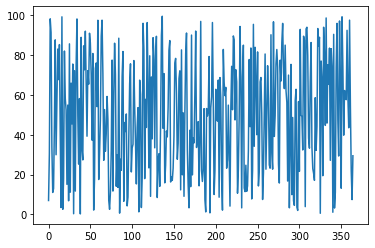

1.45 s ± 10.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [122]:
%%timeit

def ssc_2d(filename):
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        x = (int(x[0]) for x in data)
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        y = (float(x[1]) for x in data)
    return x, y #points

x, y = ssc_2d('files/NorfolkWeatherLong.csv')

#plt.plot([*x][:365],[*y][:365])
plt.plot(list(x)[:365],list(y)[:365])
plt.show()

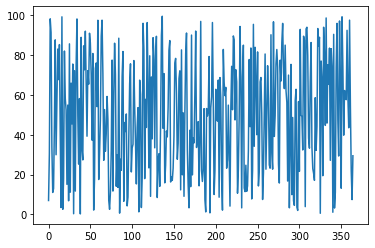

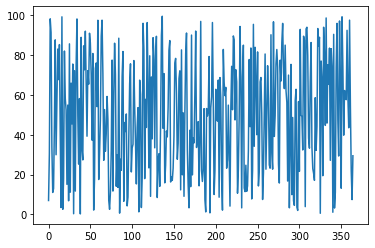

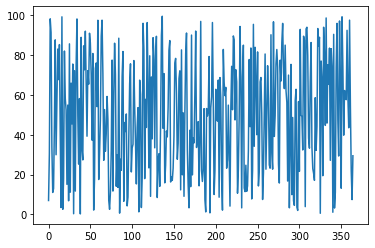

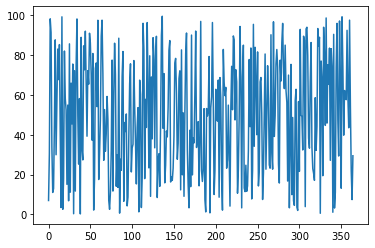

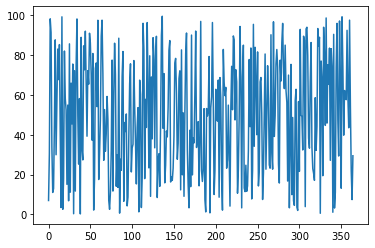

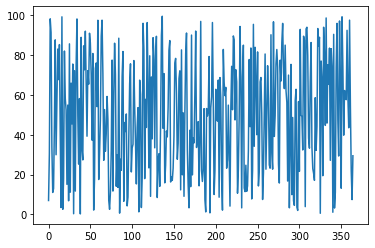

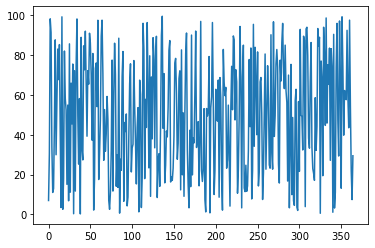

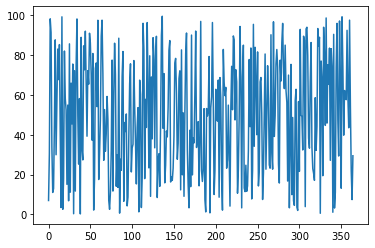

223 ms ± 2.44 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [130]:
%%timeit

from itertools import islice

def ssc_2d(filename):
    with open(filename,'r') as f:
        data = (line.strip().split(',') for line in f.readlines())
        data = ((int(point[0]), float(point[1])) for point in data)
    return data

x = ssc_2d('files/NorfolkWeatherLong.csv')
#x, y = zip(*x)

#plt.plot([*x][:365],[*y][:365])
plt.plot(*zip(*islice(x, 0, 365)))
plt.show()

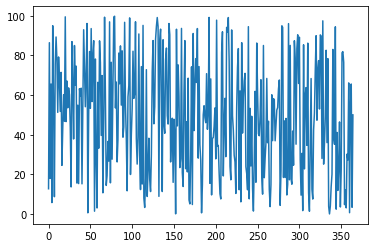

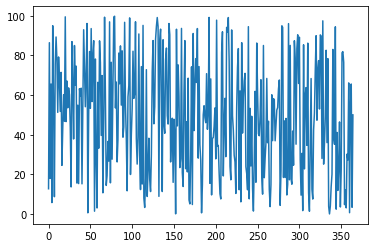

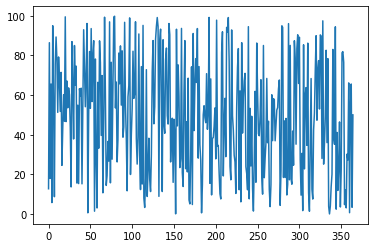

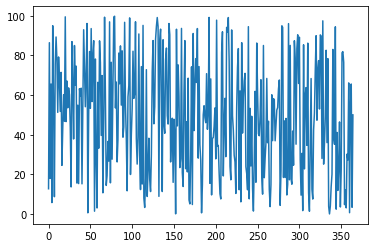

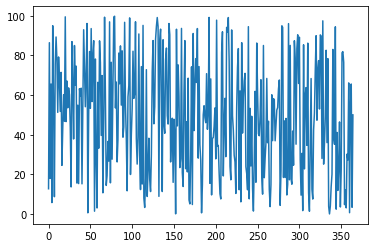

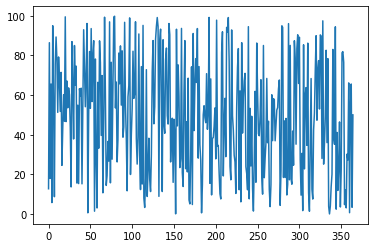

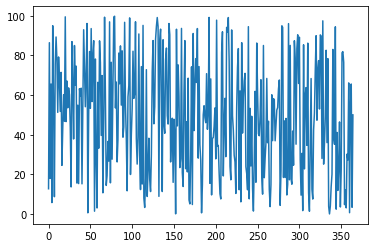

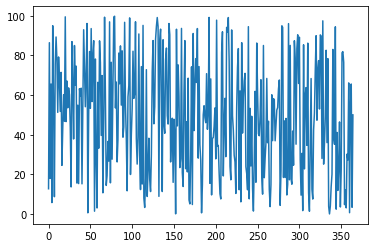

1.16 s ± 19.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [134]:
%%timeit 

def ssc_2d(file_name):
    with open(file_name,'r') as f:
        lines = (line.strip().split(',') for line in f.readlines())
        data = ((int(point[0]), float(point[1])) for point in lines)
        return data

filename = 'files/NorfolkWeatherLong.csv'
nw1999 = ssc_2d(filename)
x, y = zip(*nw1999)
#x = (p[0] for p in nw1999)
#nw1999 = ssc_2d(filename)
#y = (p[1] for p in nw1999)
plt.plot([*x][:365], [*y][:365])
plt.show()

In [30]:
def ssc_2d(data):
    data = [line.strip().split(',') for line in data]
    data = [[int(point[0]), float(point[1])] for point in data]
    return data

with open('files/NorfolkWeather1999.csv','r') as f:
    nw1999 = ssc_2d(f.readlines())

with open('files/NorfolkWeather2018.csv','r') as f:
    nw2018 = ssc_2d(f.readlines())
    
nw1999 = [p[1] for p in nw1999]
nw2018 = [p[1] for p in nw2018]

In [273]:
cut outs

SyntaxError: invalid syntax (<ipython-input-273-ef0ef23f6865>, line 1)

The three cells below contain a generator function, <code>read_lines()</code> that reads a text file one line at a time using the base Python <code>open()</code> statement.

In [253]:
def read_lines(filepath):
    with open(filepath, 'r') as f:
        while True:
            line = f.readline().strip().split(',')
            if len(line) == 2:
                yield (int(line[0]), float(line[1]))
            else:
                break

In [257]:
filepath = 'files/NorfolkWeather1999.csv'
nw1999_g = read_lines(filepath)

In [258]:
[x for x in nw1999_g]

[(0, 32.0),
 (1, 43.0),
 (2, 55.0),
 (3, 38.0),
 (4, 26.0),
 (5, 28.0),
 (6, 43.0),
 (7, 45.0),
 (8, 51.0),
 (9, 30.0),
 (10, 36.0),
 (11, 50.0),
 (12, 53.0),
 (13, 47.0),
 (14, 48.0),
 (15, 43.0),
 (16, 47.0),
 (17, 57.0),
 (18, 48.0),
 (19, 48.0),
 (20, 55.0),
 (21, 57.0),
 (22, 69.0),
 (23, 57.0),
 (24, 48.0),
 (25, 41.0),
 (26, 50.0),
 (27, 63.0),
 (28, 51.0),
 (29, 41.0),
 (30, 36.0),
 (31, 44.0),
 (32, 59.0),
 (33, 49.0),
 (34, 51.0),
 (35, 42.0),
 (36, 48.0),
 (37, 48.0),
 (38, 44.0),
 (39, 46.0),
 (40, 47.0),
 (41, 48.0),
 (42, 57.0),
 (43, 40.0),
 (44, 36.0),
 (45, 40.0),
 (46, 50.0),
 (47, 57.0),
 (48, 53.0),
 (49, 43.0),
 (50, 41.0),
 (51, 35.0),
 (52, 31.0),
 (53, 31.0),
 (54, 36.0),
 (55, 39.0),
 (56, 41.0),
 (57, 41.0),
 (58, 56.0),
 (59, 47.0),
 (60, 47.0),
 (61, 59.0),
 (62, 45.0),
 (63, 41.0),
 (64, 53.0),
 (65, 46.0),
 (66, 33.0),
 (67, 34.0),
 (68, 37.0),
 (69, 40.0),
 (70, 43.0),
 (71, 39.0),
 (72, 50.0),
 (73, 39.0),
 (74, 47.0),
 (75, 61.0),
 (76, 64.0),
 (77, 49.

# Final Exercises and Project

# Census Data

x description of US Census counties->tracts->blocks

xxx see <code>dev_data.py</code> for code to extract this data from teh US Census website

This is not _Big Data_ but it does afford an opportunity to apply both base Python and <code>pandas

Create histogram of tract population from <code>DECENNIALPL2020.P1_data_with_overlays_2021-11-05T143124.csv</code> using base Python and <code>pandas</code> for creating frequency histogram data for United States US Census Tract population.

In [51]:
filepath = 'files/DECENNIALPL2020.P1_2021-11-10T141029/DECENNIALPL2020.P1_data_with_overlays_2021-11-05T143124.csv'
df = pd.read_csv(filepath, skiprows=[1, 85397])
fh = df['P1_001N'].value_counts()

In [46]:
fh[fh == fh.max()]

0    614
Name: P1_001N, dtype: int64

In [52]:
fh.index.max()

37892

In [48]:
df[df['P1_001N'] == 331449281]

,GEO_ID,NAME,P1_001N,P1_002N,P1_003N,P1_004N,P1_005N,P1_006N,P1_007N,P1_008N,...,P1_062N,P1_063N,P1_064N,P1_065N,P1_066N,P1_067N,P1_068N,P1_069N,P1_070N,P1_071N
85395,0100000US,United States,331449281,297600338,204277273,41104200,3727135,19886049,689966,27915715,...,553,21685,8632,9141,1137,1021,1309,445,2505,2505


In [16]:
import pandas as pd
import numpy as np

In [32]:
file_name = 'files/DECENNIALPL2020.P1_2021-11-10T141029/DECENNIALPL2020.P1_data_with_overlays_2021-11-05T143124.csv'
census_gen = pd.read_csv(file_name, chunksize = 100_000)
print(type(census_gen))

<class 'pandas.io.parsers.TextFileReader'>


In [53]:
def get_gen(filepath, chunk_size):
    return pd.read_csv(filepath, skiprows=[1, 85397], chunksize = chunk_size)

In [54]:
import time

file_name = 'files/DECENNIALPL2020.P1_2021-11-10T141029/DECENNIALPL2020.P1_data_with_overlays_2021-11-05T143124.csv'

''' get maximum tract population '''
census_gen = get_gen(file_name, 100_000)
pop_max = 0

for df_chunk in census_gen:
    pop_max = max(pop_max, df_chunk['P1_001N'].astype(np.int32).max())
print(f'pop_max: {pop_max}')

start = time.time()

''' Create frequency histogram '''
census_gen = get_gen(file_name, 100_000)

''' Set up base frequency histogram: all possible values must be represented in the Series index'''
freq_hist = pd.Series(dtype=np.int64).reindex(range(pop_max), fill_value=0)
#i = 0
for df_chunk in census_gen:
    #print(i := i+ 1)
    print('.', end='')
    freq_hist = freq_hist + df_chunk['P1_001N'].value_counts().reindex(range(pop_max), fill_value=0).astype(np.int64)
    
print('\n\n')
print(freq_hist[freq_hist > 0])
print(f'Execution time: {float(time.time() - start): .2f} seconds')

pop_max: 37892
.


0        614
1         22
2         26
3         32
4         19
        ... 
22780      1
24651      1
25232      1
27220      1
30199      1
Length: 8406, dtype: int64
Execution time:  0.28 seconds


In [41]:
freq_hist[freq_hist == freq_hist.max()]

0    614
dtype: int64

# NYC Taxi Data

This data describes New York City taxi activity from xxx to xxx, and it's fields include these:

- xxx
- xxx

NYC Taxi: https://www.kaggle.com/c/new-york-city-taxi-fare-prediction/data

the particular file we are using is <code>train.csv</code>.  This is not really __Big Data__ but, at 5.5GB reading this data file into your computer in its entirety at one time... xxx find text already written xx

__Demo:__ Histogram for number of passengers

__Practice:__ Histogram for fare amount

Set up a generator to access the data

## Base Python

In [4]:
''' Reads n lines from datastream f '''
def line_reader(f, n):
    text = []
    while n and (x := f.readline()) != '':
        n -= 1
        text.append(x)
    return text

In [14]:
''' Try to refactor read function with generators '''
def just_read_chunks_lines_gen(filename, n, convert_map, headings):
    
    with open(filename, 'r') as f:
        if headings:
            yield line_reader(f, 1)[0].strip().split(',')
        while len(my_arr := line_reader(f, n)):
            my_arr = (row.strip().split(',') for row in my_arr)
            #new_ma = ((convert_map[i](ma[i]) if i in convert_map.keys() else ma[i] for i in range(len(ma))) for ma in my_arr)
            new_ma = ((convert_map[i](ma[i]) for i in convert_map.keys()) for ma in my_arr)
            yield new_ma

In [15]:
from collections import Counter
import time
from itertools import islice

start = time.time()
file_name = 'files/new-york-city-taxi-fare-prediction/train.csv'
''' convert_map must include indices of all fields to be retained '''
#convert_map = {1:float, 7:int}
convert_map = {7:int}
#i = 0
freq_hist = Counter()
columns = []
for chunk in just_read_chunks_lines_gen(file_name, 100_000, convert_map, True):
    if len(columns) == 0:
        columns = chunk
        print(columns)
    else:
        #print(i:=i+1)
        print('.', end='')
        ''' list as input to Counter() '''
        #freq_hist_curr = Counter((list(islice(x, 7, 8))[0] for x in chunk))
        freq_hist_curr = Counter((list(islice(x, 0, 1))[0] for x in chunk))
        ''' generator as input to Counter() '''
        #freq_hist_curr = Counter((islice(x, 7, 8) for x in chunk))
        freq_hist = sum((freq_hist, freq_hist_curr), Counter())
        
print('\n\n')
print(freq_hist)
print(f'Execution time: {float(time.time() - start): .2f} seconds')

['key', 'fare_amount', 'pickup_datetime', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'passenger_count']
...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................


Counter({1: 38337524, 2: 8175243, 5: 3929346, 3: 2432712, 4: 1178852, 6: 1174647, 0: 195416, 208: 64, 9: 23, 7: 15, 8: 9, 129: 2, 51: 1, 49: 1, 34: 1})
Execution time:  101.80 seconds


## <code>pandas</code>

In [7]:
import pandas as pd
import numpy as np

In [83]:
file_name = 'files/new-york-city-taxi-fare-prediction/train.csv'
read_gen = pd.read_csv(file_name, chunksize = 100_000)
print(type(read_gen))

<class 'pandas.io.parsers.TextFileReader'>


This is a generator

In [5]:
next(read_gen)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1
...,...,...,...,...,...,...,...,...
99995,2013-09-24 07:39:00.00000071,9.0,2013-09-24 07:39:00 UTC,-73.947977,40.784792,-73.964262,40.792347,5
99996,2014-05-15 12:15:45.0000001,6.0,2014-05-15 12:15:45 UTC,-73.962918,40.799107,-73.974178,40.786487,1
99997,2015-02-19 17:40:43.0000001,5.0,2015-02-19 17:40:43 UTC,-73.996773,40.723549,-73.991974,40.724724,1
99998,2009-10-10 23:35:00.000000165,6.9,2009-10-10 23:35:00 UTC,-73.983652,40.756667,-73.982715,40.767067,4


In [9]:
import time

start = time.time()
#file_name = '../data/nyc_taxi/new-york-city-taxi-fare-prediction/train.csv'

''' Set up base frequency histogram: all possible values must be represented in the Series index'''
freq_hist = pd.Series(dtype=np.int64).reindex(range(1000), fill_value=0)
#i = 0
for df_chunk in read_gen:
    #print(i := i+ 1)
    print('.', end='')
    freq_hist = freq_hist + df_chunk['passenger_count'].value_counts().reindex(range(1000), fill_value=0).astype(np.int64)
    
print('\n\n')
print(freq_hist[freq_hist > 0])
print(f'Execution time: {float(time.time() - start): .2f} seconds')

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


We could also compute a frequency histogram of fare data, although this is a bit more complex than for the (integer) number of passengers.  We either need to presume bucket interbals into which we place the (floating point) fare data or make two passes through the data, one to figure out good buckets and one to  compute the frequency histogram.

We will use the former tactic, while using the <code>bins</code> for the floating-point data.  The argument <code>bins</code> can be passed either an integer or a list of floating-point values.  In the former case, <code>pandas</code> will automatically contruct the bins whereas the values in the list for the latter approach define the breakpoints for the buckets.  The latter method is more convenient for us because we will be reading the data in chunks and the automatically defined buckets might not be the same for each chunk.

The first thing we will do is introduce a <code>pandas</code> method for constructing buckets for the frequency histogram from the bucket/bin breakpoints.

In [79]:
buckets = pd.IntervalIndex.from_breaks([0.0,2.5,5.0,7.5,10.0,15.0,20.0,40.0,60.0,80.0,100.0,120.0,140.0,160.0,99999999999999.0])
buckets

IntervalIndex([(0.0, 2.5], (2.5, 5.0], (5.0, 7.5], (7.5, 10.0], (10.0, 15.0] ... (80.0, 100.0], (100.0, 120.0], (120.0, 140.0], (140.0, 160.0], (160.0, 99999999999999.0]],
              closed='right',
              dtype='interval[float64]')

We can create an initial, empty <code>pandas</code> Series for the frequency histogram using <code>buckets</code>.

In [81]:
fh = pd.Series([], dtype=np.int32).reindex(buckets, fill_value=0)
fh

(0.0, 2.5]                   0
(2.5, 5.0]                   0
(5.0, 7.5]                   0
(7.5, 10.0]                  0
(10.0, 15.0]                 0
(15.0, 20.0]                 0
(20.0, 40.0]                 0
(40.0, 60.0]                 0
(60.0, 80.0]                 0
(80.0, 100.0]                0
(100.0, 120.0]               0
(120.0, 140.0]               0
(140.0, 160.0]               0
(160.0, 99999999999999.0]    0
dtype: int32

We can append the frequency histogram for each chunk of data to this initial series.

In [85]:
import time

''' Set up base frequency histogram with empty series: all possible values must be represented in the Series index'''
buckets = pd.IntervalIndex.from_breaks([0.0,2.5,5.0,7.5,10.0,15.0,20.0,40.0,60.0,80.0,100.0,120.0,140.0,160.0,99999999999999.0])
fh_fare = pd.Series([], dtype=np.int64).reindex(buckets, fill_value=0)

start = time.time()
#file_name = '../data/nyc_taxi/new-york-city-taxi-fare-prediction/train.csv'

for df_chunk in read_gen:
    #print(i := i+ 1)
    print('.', end='')
    fh_fare = fh_fare + df_chunk['fare_amount'].value_counts(bins=buckets).reindex(buckets, fill_value=0).astype(np.int64)
    
print('\n\n')
print(fh_fare[fh_fare > 0])
print(f'Execution time: {float(time.time() - start): .2f} seconds')

...........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................


(0.0, 2.5]                     225222
(2.5, 5.0]                    8396566
(5.0, 7.5]                   15015751
(7.5, 10.0]                  10986291
(10.0, 15.0]                 11064862
(15.0, 20.0]                  4055510
(20.0, 40.0]                  4130837
(40.0, 60.0]                  1397808
(60.0, 80.0]                    93492
(80.0, 100.0]                   32808
(100.0, 120.0]                   9584
(120.0, 140.0]          

The cells below are what I used to figure out how to create an empty series for frequency histogram with bins as the index.  the cells below aren't worth much, but I am keeping them as a reminder to demonstrate how I would typically figure out this sort of thing as a reminder that the students need to be able to do this on their own as well.

In [66]:
import random

buckets = [0.0,0.2,0.4,1.0]
fh = pd.Series([], bins = buckets, fill_value=0)
my_data = [random.random() for _ in range(100)]
sr = pd.Series(my_data)
fh = sr.value_counts(bins = [0.0,0.2,0.4,1.0])
fh

(0.4, 1.0]       60
(-0.001, 0.2]    22
(0.2, 0.4]       18
dtype: int64

In [73]:
buckets = [0.0,0.2,0.4,1.0]
pd.cut(pd.Series([], dtype=np.float32), bins=buckets)

Series([], dtype: category
Categories (3, interval[float64]): [(0.0, 0.2] < (0.2, 0.4] < (0.4, 1.0]])

In [71]:
buckets = [0.0,0.2,0.4,1.0]
fh = pd.Series([]).value_counts(bins = buckets)
fh

<ipython-input-71-ae65db34cd9a>:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  fh = pd.Series([]).value_counts(bins = buckets)


Series([], dtype: int64)

In [74]:
pd.Series([]).reindex(pd.cut(pd.Series([], dtype=np.float32), bins=buckets), fill_value=0)

<ipython-input-74-bb02b30647f0>:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  pd.Series([]).reindex(pd.cut(pd.Series([], dtype=np.float32), bins=buckets), fill_value=0)


Series([], dtype: float64)

In [76]:
buckets = pd.IntervalIndex.from_breaks([0.0,0.2,0.4,1.0])
buckets

IntervalIndex([(0.0, 0.2], (0.2, 0.4], (0.4, 1.0]],
              closed='right',
              dtype='interval[float64]')

In [78]:
pd.Series([]).reindex(buckets, fill_value=0)

<ipython-input-78-4330cc5a7e46>:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  pd.Series([]).reindex(buckets, fill_value=0)


(0.0, 0.2]    0.0
(0.2, 0.4]    0.0
(0.4, 1.0]    0.0
dtype: float64

# Citibikes Rental Data

Beyond having a business question to answer, the first step in the business analytics process cycle is to understand the data.  This data set comes from bike rental in New York City, whose website is:

[https://ride.citibikenyc.com/system-data](https://ride.citibikenyc.com/system-data)

This page describes the data fields and the data use license information can be found at:

[https://ride.citibikenyc.com/data-sharing-policy](https://ride.citibikenyc.com/data-sharing-policy)

Consistent with that agreement, monthly data files have been downloaded from 

[https://s3.amazonaws.com/tripdata/index.html](https://s3.amazonaws.com/tripdata/index.html)

and combined to create a reasonably large data file at

[https://jrbrad.people.wm.edu/data/ctba/citibikes_data.csv](https://jrbrad.people.wm.edu/data/ctba/citibikes_data.csv)

We will not discuss the data acquisition process in class, but the Python code used to acquire and combine this data is contained in the file <code>xxx</code>

Gaining a better understanding of bike rentals in Boston might include descriptive statistics on:
- Bike rental duration
- Popularity of Start/End Stations
- Frequency histogram of renters' ages or birth years
- Frequency histogram of renters' home zip codes
- Number of rentals over time
- Renters' gender distribution

xx moving average

In [63]:
with open('C:/Users/james/Downloads/201810-citibike-tripdata.csv/201810-citibike-tripdata.csv', 'r') as f:
    data = f.readlines()
data = [[z.strip('"') for z in y] for y in [x.strip().split(',') for x in data[:5]]]
# .strip('"')
print(data)

[['tripduration', 'starttime', 'stoptime', 'start station id', 'start station name', 'start station latitude', 'start station longitude', 'end station id', 'end station name', 'end station latitude', 'end station longitude', 'bikeid', 'usertype', 'birth year', 'gender'], ['330', '2018-10-01 00:00:00.7010', '2018-10-01 00:05:30.8490', '293', 'Lafayette St & E 8 St', '40.73020660529954', '-73.99102628231049', '504', '1 Ave & E 16 St', '40.73221853', '-73.98165557', '30493', 'Subscriber', '1995', '1'], ['309', '2018-10-01 00:00:13.5780', '2018-10-01 00:05:23.2310', '433', 'old - E 13 St & Avenue A', '40.72955361', '-73.98057249', '394', 'E 9 St & Avenue C', '40.72521311', '-73.97768752', '33054', 'Subscriber', '1967', '1'], ['734', '2018-10-01 00:00:16.6040', '2018-10-01 00:12:31.5050', '3472', 'W 15 St & 10 Ave', '40.742753828659026', '-74.00747358798981', '285', 'Broadway & E 14 St', '40.73454567', '-73.99074142', '33400', 'Subscriber', '1983', '2'], ['788', '2018-10-01 00:00:35.0670', 

# Bluebikes Rental Data

Beyond having a business question to answer, the first step in the business analytics process cycle is to understand the data.  This data set comes from bike rental in Boston, MA, whose website is:

[https://www.bluebikes.com/system-data](https://www.bluebikes.com/system-data)

This page describes the data fields and the data use license information can be found at:

[https://www.bluebikes.com/data-license-agreement](https://www.bluebikes.com/data-license-agreement)

Consistent with that agreement, monthly data files have been downloaded from 

[https://s3.amazonaws.com/hubway-data/index.html](https://s3.amazonaws.com/hubway-data/index.html)

and combined to create a reasonably large data file at

[https://jrbrad.people.wm.edu/data/ctba/bluebikes_data.csv](https://jrbrad.people.wm.edu/data/ctba/bluebikes_data.csv)

We will not discuss the data acquisition process in class, but the Python code used to acquire and combine this data is contained in the file <code>xxx</code>

Gaining a better understanding of bike rentals in Boston might include descriptive statistics on:
- Bike rental duration
- Popularity of Start/End Stations
- Frequency histogram of renters' ages or birth years
- Frequency histogram of renters' home zip codes
- Number of rentals over time
- Renters' gender distribution

# The End

xxx delete the multiplication??? and all these customer retention examples ???? xxx

## 2D Data: Markov Analysis of Customer Retention
Back to <a href = '#navigation'>Navigation</a>

* Data structure
  * 2-dimensional array (matrix)
  * Represented with a Python list of lists
* Operations
  * Reading data from file
  * Arranging in a 2D list
* Analysis
  * Customer forecasts with the  transition matrix

Companies believe it is less costly to keep a customer than to acquire a new one.  Companies are, therefore, interested in understanding customers buying patterns, analyzing how long a customer is likely to continue buying from them, and figuring out how to intervene in the customer lifecycle to prolong relationships with customers.

One might measure a customer's activity by selling season (if you worked for LL Bean), keeping track of whether a customer made a purchase from each season's catalog.

![LL Bean Catalogs](images/catalogs.jpg)

We can measure a customer's current level of activity by how many seasons it has been since their last purchase, which is called a customer's _state_ in Markov systems.  So, a customer's state is indicated by an integer from $0$ to $\infty$, which is the number of seasons since their last purchase.  What is described above is called a _periodic_ system because we observe customers' states at discrete periodic intervals where, here, each period is one season long.

Practically, we don't need to consider any states past some number of $n$ seasons, where customers who have not pruchased in $n$ seasons are unlikely to make another purchase from LL Bean again.  We might consider customers who haven't made a purchase in the past $n$, for some appropritely sized $n$, to exhibit behaviors akin to a new customer rather than a current one.

We could determine the percentage of times that customers in each of these states made purchases and, conversely the percentage of times they did not: these proportions can be interpreted as the probabilities of, respectively, a customer's state transitioning to $0$ and increasing by one. These probabiltiies are typical represented in a _Transition Matrix_ as shown below.  The notation $p_{x,y}$ represents the probability, or percentage of customers, on average, who transition from State $x$ to State $y$.  Note that it makes sense for all probabilities in each row to sum to $1$ because all customers (100%) in any state must transition to some state.  Call the entirety of this matrix $P$.

![Transition Matrix](images/TransitionMatrix.jpg)

If $c$ is a column vector with

$c^T = [c_0 \text{   } c_1 \text{   }  c_2 \text{   }  c_3  \text{   }  c_4 \text{   }  c_5]$

where $c_i$ is the number of customers in state $i$ at some point in time, then the number of customers in each state after the next transition step is

$c^TP$,

or, alternately, as a column vector,

$P^Tc$.

First, let's read in transition matrix data from a text file (<font face='courier'>transMat.txt</font>) and instantiate a Python data structure representing $P$.  The greatest state in this file  is $n=5$.  Pay attention to ensure that all the elements are converted to numerical quantities.

In [ ]:
""" Read the transition matrix file data into a list of lists with numerical elements """


In [ ]:
""" Read the transition matrix file data into a list of lists with numerical elements with list comprehension """


#### Compute Next Period Customer Distribution with the Transition Matrix

Let's represent our current customer base by a vector with each element representing the number of customers in each state, $s = \left\lbrace 0, 1, \ldots , 5 \right\rbrace$. Name a Python variable <font face = 'courier'>custNow</font> to represent the population of customers in each category now and <font face = 'courier'>custNext</font> to represent the expected number of customers in each category next period.  Compute the expected number of customers in each of the states for next season, <font face = 'courier'>custNext</font>.

In [ ]:
custNow = [1024, 512, 256, 2048, 5092, 10184]

custNext = ???

Perform the previous computation with list comprehension.

## Another Computation with the Transition Matrix

The transition matrix for two seasons in the future is the transition matrix multiplied by itself, that is, the dot product of $P$ with itself.  Perform that calculation.

![Matrix Multiplication](images/P2.jpg)

Perform the computation above with list comprehension.

## A Final Computation with the Transition Matrix

What is the expected customer population by state five years (20 seasons, 100 seasons) from now?

## 2D Data: Rendering a Grayscale Image
Back to <a href = '#navigation'>Navigation</a>

* Data structure
  * 2-dimensional array (matrix)
  * Represented with a Python list of lists
* Operations
  * Creating data (2D list) with list comprehension
  * Reshaping a 2D list of lists into a 1D list
* Analysis
  * Plotting data with <font face='courier'>matplotlib</font>

Let's look at some basics of rendering images in two dimensions before we move on to 3D data.

Rather than input data from a file, we'll quickly create some data with code for this example of how to render a grayscale immage.  We will use <font face='courier'>matplotlib</font> to render the image by 'plotting' each pixel.  Grayscale pixels are coded with integers from 0 to 255, where 0 is black and 255 is white.  You can interpret these values as brightness or whiteness.  We will create an $8 \times 8$ checkerboard of pixels whose codes alternate between 0 and 255.

The <font face='courier'>plt.imshow()</font> function of <font face='courier'>matplotlib</font>, in conjunction with the <font face='courier'>cmap='gray'</font> argument, normalizes the data by assigning the color black to the minimum value in the array and white to the maximum value.  Intermediate values are assigned gray tones of darkness proportionate to their value.  The optional <font face='courier'>vmin</font> and  <font face='courier'>vmax</font> arguments may be used to establish values for black and white, respectively, in case those values are not contained in the data.

In [ ]:
import matplotlib.pyplot as plt
dim = 8    # dimension of the plot

checker = [[0 if (i+j)%2 else 255 for i in range(dim)] for j in range(dim)]
print(checker)

plt.imshow(checker, cmap='gray', vmin = 0, vmax = 255)
plt.show()

Different analyses require the data to be in different shapes.  An $8 \times 8$ lists of lists was required by <font face='courier'>matplotlib</font> for the plot above.  The two-dimensional plot is appropriate inpute for some neural networks but, if this pattern were to be analyzed by other neural network architectures, it would need to be in a one-dimensional array.

In [ ]:
[checker[i][j] for i in range(len(checker)) for j in range(len(checker[i]))]

## 3D Data: Image Processing
Back to <a href = '#navigation'>Navigation</a>

We view images in 2 dimensions.  Color images, however, require 3-dimensional data because the color of each pixel is a mixture of Red, Green, and Blue (RGB) hue intensities.

The image below shows the data structure of a color image that is $3 \times 3$ pixels.  The data required for rendering pixel $[0][0]$, for example, requires the three data elements noted in the figure.

![RGB Data Structure](images/RGB1Image.jpg 'Data Structure for RGB Image')

## Read & Display Color (RGB) 3D Image Data
Back to <a href = '#navigation'>Navigation</a>

* Data structure
  * 3-dimensional array (tensor)
  * Represented with a Python list of of lists of lists
* Operations
  * Reading 3D data from a file
* Analysis
  * Rendering the data with <font face='courier'>matplotlib</font>

<font face='courier'>image.txt</font> contains RGB data for an image that is 374 pixels wide by 288 pixels high.  Each pixel is encoded in RGB by three integers from 0 to 255 each of which indicates the hue intensity of red, green, and blue, respectively.  (Larger values indicate greater hue intensity.)  The data file is structured with the data for each pixel on a separate line with the three values separated by commas.  Don't forget that each line in a text file ends with the 'hidden' character '\n'.  The data needs to be structured in the three-dimensional format as indicated in the previous figure.

Read that data, putting it into a $374 \times 288$ image with each pixel coded with a 3-element RGB code.

In [ ]:
import matplotlib.pyplot as plt

f = open('image.txt','r')
dimHorizontal = 374
dimVertical = 288
image = []

for i in range(dimVertical):
    newRow = []
    for j in range(dimHorizontal):
        pixel = f.readline()
        pixel = pixel.strip()
        pixel = pixel.split(',')
        for k in range(len(pixel)):
            pixel[k] = int(pixel[k])
        newRow.append(pixel)
    image.append(newRow)

f.close()

print('Height:',len(image),'  Width:', len(image[0]), '  Number of RGB elements:',len(image[0][0]), \
      '  Sample pixel RGB:', image[0][0])
plt.imshow(image)
plt.show()

In [ ]:
print(image)

Construct the image using list comprehension

In [ ]:
import matplotlib.pyplot as plt

""" Open the file """
f = open('image.txt','r')
data = f.readlines()
f.close()
for i in range(len(data)):
    data[i] = data[i].strip().split(',')

dimHorizontal = 374
dimVertical = 288

""" Process the data """
plt.imshow([[[int(p) for p in data[i*dimHorizontal + j]] for j in range(dimHorizontal)] for i in range(dimVertical)])
plt.show()

An alternative, that is a little more advanced.  Use it if you understand it; don't worry if you don't understand it right now.

The main idea and difference from the code above is that the string operation are executed in the list comprehension and the <font face='courier'>map</font> function is used to convert all three pixels in each row from string to integer quantitities.

In [ ]:
import matplotlib.pyplot as plt

""" Open the file """
f = open('image.txt','r')
data = f.readlines()
f.close()

dimHorizontal = 374
dimVertical = 288

""" Process the data """
plt.imshow([[list(map(int, data[i*dimHorizontal + j].strip().split(','))) for j in range(dimHorizontal)] for i in range(dimVertical)])
plt.show()

## Repeat Data Acquisition with List Comprehension


In [ ]:
f = open('image.txt','r')
data = [[int(x) for x in f.readline().strip().split(',')] for i in range(dimHorizontal * dimVertical)]
plt.imshow([[[int(p) for p in data[i*dimHorizontal + j]] for j in range(dimHorizontal)] for i in range(dimVertical)])
plt.show()
f.close()

## Exercise: Display just the Dog's Head 

If you have executed the code above, then you have a list of lists already populated named iamge from which you can display the required data for displaying the dog's head.

In [ ]:
newImage = []
heightBottom = 30
heightTop = 150
widthLeft = 225
widthRight = 325

for i in range(heightBottom,heightTop):
    newRow = []
    for j in range(widthLeft,widthRight):
        newRow.append(image[i][j])
    newImage.append(newRow)

plt.imshow(newImage)
plt.show()

## Repeat Using List Comprehension

Alter a grayscale MNIST image so that it can rendered as a color image.  <font face='courier'>mnistEg.txt</font> is a file with 28 rows, with each row containing 28 integers  each of which is in the interval $[ 0 , 255]$.  We used <font face='courier'>cmap='gray'</font> to indicate a grayscale image when plotting.  This time, that argument is not needed because we will be rendering in color, which is the default.

Hints: Gray scale colors have equal proportions red, green, and blue (RGB) hues, as in these examples:    
  - Black: (R,G,B) = (0,0,0)
  - White: (R,G,B) = (255,255,255)
  - Medium Gray: (R,G,B) = (128,128,128)
  - Dark Gray: (R,G,B) = (80,80,80)


to create the 'negative' image using the formula 255 - <font face='courier'>p</font>, where <font face='courier'>p</font> is a pixel value in $[ 0 , 255]$.



In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt 
f = open('mnistEg.txt', 'r')
rgb = f.readlines()
f.close()
for i in range(len(rgb)):
    rgb[i] = rgb[i].strip().split(',')                # strip and split string input data
    for j in range(len(rgb[i])):
        rgb[i][j] = int(rgb[i][j])                    # convert data from string to integer
        rgb[i][j] = (rgb[i][j], rgb[i][j], rgb[i][j]) # change single pixel integers to 3-tuples

plt.imshow(rgb)
plt.show()

# Dictionaries from Text Files

## A more difficult example: Electrical Grid Networks

* Data structure
  * Dictionary with key-value structure
  * Keys are tuples
  * Values are floating-point values
* Operations
  * Reading data from a file
      * <font face = 'courier'>for</font> loop
      * Alternately, list comprehension could be used
* Analysis
  * Cluster analysis

_Small World Networks_ have been a popular topic in recent years, both in academic research as well as in popular magazines.  The idea that all humans are separated by no more than _six degrees of separation_ is intrguiing ([Wikipedia Link](https://en.wikipedia.org/wiki/Six_degrees_of_separation) and you may have heard about how all movie stars are connected via the movies they've played in with no more than six connections from the actor Kevin Bacon: ([The Oracle of Kevin Bacon](https://oracleofbacon.org/).  Studies of other networks such as electrical grids reveal small-world networks that are highly connected.  One famous paper on this topic is by Duncan Watts and Steven Strogatz [Watts & Strogatz](http://worrydream.com/refs/Watts-CollectiveDynamicsOfSmallWorldNetworks.pdf).

Suppose we are analyzing an electricity distribution network and we are concerned with the connectedness of the network and, in particular, with identifying clusters of highly-connected clusters that are connected relatively sparsely with the remainder of the network.  The sparse connections ebtween highly-connected clusters identify the vulnerable parts of the network that could cause widespread electricity outages, as illustrated below.  See [Related GE Grid Story](https://www.ge.com/reports/post/74545123735/its-a-small-world-ge-google-maps-to-draw-a/), [Related Academic Article](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=5448813), and [Another Academic Article](https://ieeexplore.ieee.org/abstract/document/4116107).  We are also concerned with the miles of cable that have been used for connectiong the junctions of the network.

![Vulnerable Network](images\network.jpg)

We will input data into a dictionary for this analysis.  The dictionary keys will be the location IDs, as a tuple with elements indicating the location IDs that are connected, and the values will be the miles of cable connecting the two points.  The data is in the file <font face='courier'>network.txt</font> and each line has three values, in this order:

Location 1 ID, Location 2 ID, miles of cable

Notice that if two locations are connected than the ordering of the location IDs is arbitrary and there is only one row reflecting that connection.  In other words, there is only one row of data per connection and we will not find a stat row '1,2,50' if another row with '2,1,50' is in the data file.

#### 1st Task: Create a Dictionary
Open the data file named <font face='courier'>network.csv</font>, which documents the connections between the 101 points in the network, and create a dictionary named <font face='courier'>network</font> with these keys and values:
- The key is a tuple with the integers representing the IDs of two point being conencted with a cable
- The value is the distance between those points

#### 2nd Task: Identify a Cluster
Take the arbitrary point ID = 0 and determine all the points that have a connection with that point, either directly or through another point or points.  Print (1) the number of connected points and (2) the IDs of those points.  We will use the <font face='courier'>set</font> data type to solve this problem.

In [ ]:
network = {}

f_in = open('network.csv','r')
data = f_in.readlines()
for i in range(len(data)):
    data[i] = data[i].strip()
    data[i] = data[i].split(',')
    network[(int(data[i][0]),int(data[i][1]))] = float(data[i][2])
network

In [ ]:
clustIDs = {0}
clustCount = len(clustIDs)

# Iterate through the locations to find other connected locations until no further locations are found
while True:
    for k in network.keys():
        if k[0] in clustIDs or k[1] in clustIDs:
            clustIDs.add(k[0])
            clustIDs.add(k[1])
    newclustCount = len(clustIDs)
    if newclustCount == clustCount:
        break
    else:
        clustCount = newclustCount
    
print('Number of points in the connected cluster:',clustCount)
print('Connected cluster points membership:',clustIDs)

# Afterward
Back to <a href = '#navigation'>Navigation</a>

This notebook has provided exercises in these critical Python skills:

- Iterating through data with <font face='courier'>for</font> loops
- Experience with, and examples of where comprehending the multi-dimensionality of data is important
- Examples requiring data in different numbers of dimensions

Expertise with <font face='courier'>for</font> loops is always needed in Python, regardless of the level of expertise one attains.  Packages such as <font face='courier'>pandas</font> and <font face='courier'>numpy</font> make reshaping data structures and reading data from files easier, but a programmer will not be successful, even with these tools, if they cannot visualize data structures in multiple dimensions.  Manually iterating through data of multiple dimensions as we have done helps to build that intuition.  Even with easy-to-use reshaping functions in <font face='courier'>pandas</font> and <font face='courier'>numpy</font>, expertise with <font face='courier'>for</font> loops is still frequently required for purposes other than reading and initializing data structures.

# Review of <font face='courier'>for</font> Loops
Back to <a href = '#navigation'>Navigation</a>

<font face='courier'>for</font> loops can be used to access the elements of _iterable_ data types, which includes:

- lists
- tuples
- dictionaries

Elements can sometimes be revised of the data type is mutable.  Lists can be freely changed, tuples cannot be changed, while dictionary values can be changed although dictionary keys cannot.  This section reviews the basics of _iterating_ through lists and dictionaries.

## Looping through Lists <a name='loops' />
Back to <a href = '#navigation'>Navigation</a>

You can access all the elements within a list using a _for_ loop.  This approach is generally called _iterating through a list_.  Lists are just one of the data types that you can iterate through: we call the collection of all such data types <font face='courier'>iterables</font>. For loops are perfect for accessing all the elements in a list because the <font face='courier'>len()</font> function cand be used to determine how many times the loop must be executed.  

There are two ways to iterate through data and objects with for loop, which are illustrated below:
- by index
- directly by referencing the items being iterated

Within a loop, we can access the value of a list element and use it in a computation or assign a new value to it.

In [ ]:
myList = [65,89,21,34,72,38,50,68,17]

We can loop through a list and access each element by using a dummy variable <font face='courier'>ele</font> (short for element), which is assigned a copy of the value of each element.  For starters, we will jsut print each element.

In [ ]:
for ele in myList:
    print(ele)

Alternatively, we can print each element by constructing a range of indices that corresponds with the length of the list, and use those indices to access the data elements.

In [ ]:
for i in range(len(myList)):
    print(myList[i])

So far, we have just accessed the value as if we were printing them or using them in a computation.  What if we wanted to change some values in the list.  Here is one approach.  Does it work?

In [ ]:
for i in range(len(myList)):
    if myList[i] > 60:
        myList[i] = 'new value'
print(myList)

Now, let's use the first approach we demonstrated.

In [ ]:
myList = [65,89,21,34,72,38,50,68,17]
for ele in myList:
    if ele > 60:
        ele = 'new value'
print(myList)

Let's discuss what is going on.  You cannot, obviously, use the approach in the cell above to change values in a list.

## Dictionaries <a name = "dictionaries" />
Back to <a href = '#navigation'>Navigation</a>

Dictionaries:
- Are indicated by curly braces each of its elements, which are separated by commas, have two components separated by a colon
- Dictionary element _keys_ are indicated before the colon
- Dictionary element _values_ are indicated after the colon
- Each key is unique: only one dictionary may have any particular key
- We often think of a dictionary key as a way to look up a dictionary value

You can simply use a key to look up a dictionary value or change the value.

In [ ]:
# Example dictionary
myDiction = {0:'cero', 1:'uno', 2:'sod', 3:'tres'}

In [ ]:
print(myDiction[2])

In [ ]:
myDiction[2] = 'dos'
print(myDiction)

## Looping through Dictionaries <a name='LoopThroughDict' />
Back to <a href = '#navigation'>Navigation</a>

We can use loops to access all the elements in a dictionary.  Dictionaries are usual _iterated_ through by key, which means that we access all of the uniques in one manner or another.  Two of the ways are illustrated below, the first of which shows that when we simply put the dictionary name in a for statement, we iterate through teh keys by default.  We can also explicitly use the <font face = 'courier'>.keys()</font> property of dictionaries to remind ourselves that we are iterating through the keys: this is the second approach below.

In [ ]:
for key in myDiction:
    print(key, myDiction[key])

In [ ]:
for k in myDiction.keys():
    print(k, myDiction[k])

A frequently-used method of looping explicitly through both the keys and values in a dictionary is as follows using the <font face = 'courier'>.items()</font> method of dictionaries.  When two dummy variables are used in the for statement each key and value pair are _unpacked_ into the two variables.

In [ ]:
for key,value in myDiction.items():
    print(key,value)

Or, you can use this more succinct code.  As you get more experience it will be obvious that you are dealing with a dictionary and <font face='courier'>k</font> is the key and <font face='courier'>v</font> is the value.

In [ ]:
for k,v in myDiction.items():
    print(k,v)

# xxx Replace aliasing with newer aliasing examples

# Aliasing <a name = 'aliasing' />
Back to <a href = '#navigation'>Navigation</a>

Aliasing the the act of referencing the same memory location/variable using multiple names.  It happens most often unintentionally and can cause a frustrating debugging adventure.

with <font face='courier'>int</font> and <font face='courier'>float</font> data types there is no chance of aliasing.  Everything works intuitively.  When we change the value of <font face='courier'>p</font> we change only its value and not the value of <font face='courier'>q</font>.  The converse is true when we change the value of <font face='courier'>q</font>.

In [ ]:
p = 1
q = p
p = 2
print('p =',p,'     q =',q)

When we assign a list to another list, however, both list names point to the same data, which is to say that they both pint to the same place in memory.

In [ ]:
x = [1,2]
y = x
y[0] = 99
print('x =',x,'     y =',y)

We often need to create a list, or list of lists, to receive our computations, such as when we are computing the tranpose of a lsit of lists.  Using the apprach above would create aliasing and we would either end up with a matrix with the wrong values, or we would corrupt the original matrix, or both.

One safe way to create a list of lists of the same dimension as an existing list of lists, use the approach in the cell below.

In [ ]:
X = [[0,1,2],[3,4,5],[6,7,8]]  # original list of lists
Y = [[0 for i in range(len(X[0]))] for j in range(len(X))] # list of lists to receive the transpose
print('Y  =',Y,'\n')
Y[0][0] = 99
print('Y =',Y,'\n')
print('X =',X,'\n')

You may also import the <font face='courier'>copy</font> package and use the <font face='courier'>copy.deepcopy()</font> method (see [<font face='courier'>list.copy() function</font>](https://docs.python.org/3.6/library/copy.html)) but I prefer the approach above.

I have had issues with aliasing with the methods below, so <font color='red'><b>DO NOT USE THE METHODS BELOW</b></font>.

In [ ]:
X = [[0,1,2],[3,4,5],[6,7,8]]  # original list of lists
Y = [[0] * len(X[0])]  * len(X)  # list of lists to receive the transpose
print('Y  =',Y,'\n')
Y[0][0] = 99
print('Y =',Y,'\n')
print('X =',X,'\n')

In [ ]:
X = [[0,1,2],[3,4,5],[6,7,8]]  # original list of lists
Y = X.copy()  # list of lists to receive the transpose
print('Y  =',Y,'\n')
Y[0][0] = 99
print('Y =',Y,'\n')
print('X =',X,'\n')

These approaches successfully create copies of list while avoiding aliasing for 1-dimensional matrices, but they create aliasing with multidimensional matrices.

In [ ]:
X = [[0,1,2],[3,4,5],[6,7,8]]  # original list of lists
Y = X[:]  # list of lists to receive the transpose
print('Y  =',Y,'\n')
Y[0][0] = 99
print('Y =',Y,'\n')
print('X =',X,'\n')

In [ ]:
X = [[0,1,2],[3,4,5],[6,7,8]]  # original list of lists
Y = list(X) # list of lists to receive the transpose
print('Y  =',Y,'\n')
Y[0][0] = 99
print('Y =',Y,'\n')
print('X =',X,'\n')